In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import Libraries and Load Data

In [2]:
# Load the TensorBoard notebook extension.

%reload_ext tensorboard
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense
from keras.regularizers import l2
from tensorflow.keras import regularizers
from tensorflow.keras import initializers
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.optimizers import SGD
from tensorflow.python.keras.optimizer_v2.adam import Adam
from tensorflow.keras.layers import Dropout
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from tensorflow.keras import backend as K
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import pathlib
import pickle
import pathlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
from datetime import datetime
import seaborn as sns
import tensorboard
import os
tensorboard.__version__

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


'2.7.0'

In [3]:
# Load Data from Google Drive Shared Drive (Microclimate-Building Energy)
Data = pd.read_csv('/content/drive/Shareddrives/Microclimate-Building Energy/Data/microclimate_model/Combined/summer_limited2.csv')
Data = Data.drop(columns = ['Unnamed: 0'])

# *Functions Used in Notebook*

In [93]:
# USE TO RETRUN ONE-HOT-ENCODED DATA TO ORIGINAL COLUMNS
def undummify(df, prefix_sep="_"):
    cols2collapse = {
        item.split(prefix_sep)[0]: (prefix_sep in item) for item in df.columns
    }
    series_list = []
    for col, needs_to_collapse in cols2collapse.items():
        if needs_to_collapse:
            undummified = (
                df.filter(like=col)
                .idxmax(axis=1)
                .apply(lambda x: x.split(prefix_sep, maxsplit=1)[1])
                .rename(col)
            )
            series_list.append(undummified)
        else:
            series_list.append(df[col])
    undummified_df = pd.concat(series_list, axis=1)
    return undummified_df

# PCA Transformation
def pca_conversion(data, n):
  PCA_instance = PCA(n_components = n).fit(data)
  return PCA_instance

# USE TO ADD TIME SHIFTED DATA FOR COLS (T-(timestep)) AND REORDERS DATA COLUMNS
def time_shift(df, timestep, cols):
  if timestep > 0:
    cols_ = ['shifted_' + str(timestep) + '_' + col for col in cols]
    df[cols_] = df[cols]
    df[cols_] = df[cols_].shift(periods=timestep*-1)
  elif timestep == 0:
    pass
  return df
  
def square_terms(df, sqcols):
  for i in sqcols:
    df[(i + ' Squared')] = df[i]**2
  return df

def interaction_terms(df, intcols):
  df[(intcols[0] + ' x ' + intcols[1])] = df[intcols[0]]*df[intcols[1]]
  return df

# CHANGE SHADE ON FACADES OF DATA
def change_shade(df, shadered, facades):
  """
  :df: dataframe to change shade for
  :shadred: amount of shade to reduce (0 - 1)
  :facades: facades in df columns, enter 'All' for all facades
  :return: df with shade modifications
  """ 
  if facades == 'All':
      facade = ['Shade West', 'Shade East', 'Shade North', 'Shade South']
      for f in facade:
        df.loc[df[f] + df[f]*shadered > 1, f] = 1
        df.loc[df[f] + df[f]*shadered < 1, f] = df[f] + df[f]*shadered
  else:
    for f, F in enumerate(facades):
      df.loc[df[F] + df[F]*shadered[f] > 1, F] = 1
      df.loc[df[F] + df[F]*shadered[f] < 1, F] = df[F] + df[F]*shadered[f]
  return df

# USE TO RUN BASE MODEL AFTER SELECTING FEATURES
def base_model(epochs, batch_size, dropout, validation_split, test_size): 
  """
  :epoch: number of epochs to run
  :batch_size: batch size
  :dropout: dropout value
  :return: results and model
  """ 
  model = Sequential()
  model.add(Dense(10, input_dim = len(X.columns), activation='relu'))
  model.add(Dense(50, activation='relu'))
  model.add(Dropout(dropout))
  model.add(Dense(50, activation='relu'))
  model.add(Dense(32, kernel_regularizer=l2(0.01), bias_regularizer=l2(0.01)))
  model.add(Dense(50, activation='relu'))
  model.add(Dropout(dropout))
  model.add(Dense(1, activation = 'linear'))
  model.compile( loss = 'mse', optimizer = 'adam', metrics=[tf.keras.metrics.MeanSquaredError()])
  epochs = epochs
  batch_size = batch_size
  validation_split = validation_split
  history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=validation_split)
  y_preds = model.predict(X_test)
  RMSE = np.sqrt(metrics.mean_squared_error(y_test, y_preds))
  R2_score = metrics.r2_score(y_test, y_preds)
  results = pd.DataFrame({'R2 Score': [R2_score], 'RMSE':[RMSE]})
  results['Epoch'] = epoch
  results['Dropout'] = dropout
  results['Validation_Split'] = validation_split
  results['Test Data'] = test_size
  return results, model, history

def plot_loss_accuracy(history):
    fig = plt.figure(figsize=(20, 6))
    ax = fig.add_subplot(1, 2, 1)
    ax.plot(history.history["loss"],'r-x', label="Train Loss")
    ax.plot(history.history["val_loss"],'b-x', label="Validation Loss")
    ax.legend()
    ax.set_title('MSE Loss')
    ax.grid(True)

# Data Analysis

## Choose Columns and Perform Data Transformations

In [ ]:
data = Data.copy()
tdflist = list(data.columns)
for i, I in enumerate(data):
  print(i+1, ' ', I)

inp = []
inp.append(int(input('Enter column number: '))-1)
ask = int(input('Would you like to add more [0 for yes]: '))

while ask == 0:
  inp.append(int(input('Enter column number: '))-1)
  ask = int(input('Would you like to add more [0 for yes]: '))

accessed_mapping = map(tdflist.__getitem__, inp)
accessed_list = list(accessed_mapping)

data = data[accessed_list]

1   bldgname
2   Date_Time
3   Month
4   Day
5   Hour
6   Minute
7   Air Temp
8   Abs Hum
9   Rel Hum
10   DSW Top
11   DSW North
12   DSW East
13   DSW South
14   DSW West
15   Shade North
16   Shade East
17   Shade South
18   Shade West
19   KW
20   CHWTON/SQFT
21   CHWTON
22   HTmmBTU
Enter column number: 11
Would you like to add more [0 for yes]: 0
Enter column number: 12
Would you like to add more [0 for yes]: 0
Enter column number: 13
Would you like to add more [0 for yes]: 0
Enter column number: 14
Would you like to add more [0 for yes]: 1


In [ ]:
savedf = data.copy()
cols = data.columns

## Check VIF

A simple method to detect multicollinearity in a model is by using something called the variance inflation factor or the VIF for each predicting variable. An acceptable VIF is if it’s less than the max of 10



In [92]:
# Shade Data
shade_vif = pd.DataFrame()
shade_vif["feature"] = X.columns[:-6]
shade_vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns[:-6]))]

display(shade_vif)

,feature,VIF
0,Air Temp,50323.438644
1,Abs Hum,10274.427480
2,KW,607.273715
3,HTmmBTU,42.920125
4,Air Temp Squared,39702.938593
5,Abs Hum Squared,3106.218873
6,Air Temp x Abs Hum,7016.989233
7,Shade Sum,11.160853
8,shifted_1_Air Temp,48571.719235
9,shifted_1_Abs Hum,10681.898484


## Normalize Data

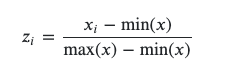

In [ ]:
# Normalize DSW Data
for i in cols:
  data[i] = (data[i] - data[i].min()) / (data[i].max() - data[i].min())

## Check Historgram

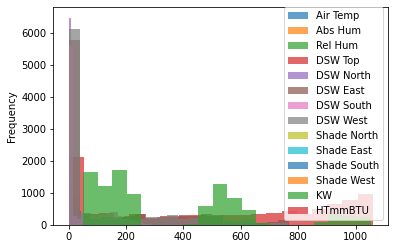

In [ ]:
for i in list(data.columns):
  data[i].plot.hist(bins = 20, alpha=0.7)
plt.legend()

In [ ]:
data.hist()

## Check Correlation Matrix

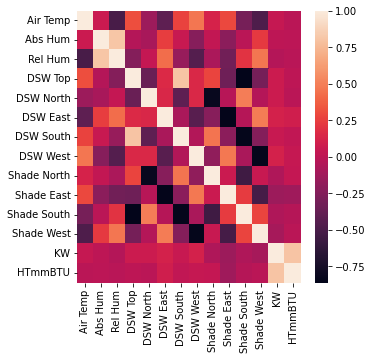

In [ ]:
corrMatrix = data[list(data.columns)].corr()
plt.figure(figsize=(5,5))
sns.heatmap(corrMatrix)
plt.show()

## Standard Scaler

In [ ]:
# Scale Data
scaler = StandardScaler()
data1[data1.columns] = scaler.fit_transform(data1[data1.columns])

## PCA

In [ ]:
pcadata = data[data.columns]

In [ ]:
pcadata

,DSW North,DSW East,DSW South,DSW West
0,0.00000,0.000000,0.0,0.0
1,0.00000,0.000000,0.0,0.0
2,0.00000,0.000000,0.0,0.0
3,0.00000,0.000000,0.0,0.0
4,7.77669,3.178121,0.0,0.0
...,...,...,...,...
9744,0.00000,0.000000,0.0,0.0
9745,0.00000,0.000000,0.0,0.0
9746,0.00000,0.000000,0.0,0.0
9747,0.00000,0.000000,0.0,0.0


In [ ]:
## PCA

n = int(input('Enter number of n_components for PCA: '))

PCA_ = pca_conversion(pcadata, n)

Enter number of n_components for PCA: 2


In [ ]:
pcadf = pd.DataFrame(PCA_.transform(pcadata))

# ***Baseline Model***

## *Define* Base NN Model

In [137]:
## Select data scenario
scenarios = ['With All', 'Without DSW', 'Without Shade', 'Without DSW and Shade'] 
print('[1] WITH ALL -- [2] WITHOUT DSW -- [3] WITHOUT SHADE -- [4] WITHOUT DSW AND SHADE')
feat_type = int(input('Enter scenario: '))

ogcols = ['DSW Top','DSW North','DSW South','DSW East','DSW West','Shade North','Shade East','Shade West','Shade South']

if feat_type == 1:
  cols = ogcols[1:]
elif feat_type == 2:
  cols = ogcols[5:]
elif feat_type == 3:
  cols = ogcols[1:5]
elif feat_type == 4:
  cols = []

# Enter timestep to shift data
shift_ = int(input('Timestemps to shift df: '))

print(cols)

[1] WITH ALL -- [2] WITHOUT DSW -- [3] WITHOUT SHADE -- [4] WITHOUT DSW AND SHADE
Enter scenario: 2
Timestemps to shift df: 0
['Shade North', 'Shade East', 'Shade West', 'Shade South']


In [138]:
## Run this cell to remove some buildings 

Data_Red = Data[(Data['bldgname'] != 'Bulldog Hall') 
                & (Data['bldgname'] != 'Psychology North') 
                & (Data['bldgname'] != 'Noble Library')
                & (Data['bldgname'] != 'Biodesign C')
                & (Data['bldgname'] != 'Schwada COB')]

Data_Red = Data_Red[Data_Red['Month'] != 8]

In [139]:
# Copy Original Data
Data_Scaled = Data_Red.copy()
#Data_Scaled = Data_Scaled.drop(columns = ['KW', 'HTmmBTU'])
# Replace Shade and DSW Columns
Data_Scaled = Data_Scaled.drop(columns = ogcols)
Data_Scaled[cols] = Data[cols]
# Add Squared and Interactions Terms
sq_terms = int(input('To add square terms for Air Temp and Abs Hum, press 1: '))
if sq_terms == 1:
  Data_Scaled = square_terms(Data_Scaled, ['Air Temp', 'Abs Hum'])
int_terms = int(input('To add interaction term for Air Temp and Abs hum press 1: '))
if int_terms == 1:
  Data_Scaled = interaction_terms(Data_Scaled, ['Air Temp', 'Abs Hum'])
# Sum Columns into One
sum_cols = int(input('To sum DSW and Shade Columns press 1: '))
if sum_cols == 1:
  # Get Shade Columns
  shadecols = ['Shade North', 'Shade East', 'Shade West', 'Shade South']
  # Get sum of all shade columns
  if (feat_type == 1) or (feat_type == 2):
    Data_Scaled['Shade Sum'] = Data_Scaled[shadecols].sum(axis=1)
    Data_Scaled = Data_Scaled.drop(columns = shadecols)
  # Get DSW Columns
  DSWcols = ['DSW North', 'DSW East', 'DSW West', 'DSW South']
  # Get sum of all DSW columns
  if (feat_type == 1) or (feat_type == 3):
    Data_Scaled['DSW Sum'] = Data_Scaled[DSWcols].sum(axis=1)
    Data_Scaled = Data_Scaled.drop(columns = DSWcols)
# Drop Columns
Data_Scaled = Data_Scaled.drop(columns = ['CHWTON', 'Rel Hum'])
# Assign columns to shift
shiftcols = list(Data_Scaled.columns[6:])
shiftcols.remove('CHWTON/SQFT')
# Perform Data Shift for each building and dropna
buildings = Data_Scaled['bldgname'].unique()
x_list = []
y_list = []
# Get unique months in dataset
unique_m = Data_Scaled['Month'].unique()
# Loop Over Every Day in Data
for m,M in enumerate(unique_m):
  unique_d = Data_Scaled[Data_Scaled['Month'] == M]['Day'].unique()
  for d,D in enumerate(unique_d):
    for b,B in enumerate(buildings):
      bldg_df = Data_Scaled[Data_Scaled['bldgname']== B].copy()
      month = bldg_df.loc[bldg_df['Month'] == M]
      day = month.loc[month['Day'] == D]
      xday = time_shift(day, shift_, shiftcols)
      xday = xday.dropna()
      yday = xday.pop('CHWTON/SQFT')
      x_list.append(xday)
      y_list.append(yday)
x_df = x_list[0]
y_df = y_list[0]
for i in range(len(x_list)-1):
  x_df = x_df.append(x_list[i+1])
  y_df = y_df.append(y_list[i+1])

# Scale X Data
xcols = x_df.columns[6:]
xscaler = StandardScaler().fit(x_df[xcols])
x_df[xcols] = xscaler.transform(x_df[xcols])
# Use to rearrange X data
bldg_cols = ['bldgname_Biodesign A', 'bldgname_Biodesign B', 'bldgname_Biodesign C',
              'bldgname_Bulldog Hall', 'bldgname_Goldwater', 'bldgname_ISTB 2',
              'bldgname_ISTB 4', 'bldgname_Noble Library', 'bldgname_Psychology',
              'bldgname_Psychology North', 'bldgname_Schwada COB']
# Assign X
X = x_df[xcols]
X['bldgname'] = x_df['bldgname']
X = pd.get_dummies(X)

# Assign Y 
Y = y_df
Y = Y.values.reshape(-1, 1)
yscaler = StandardScaler().fit(Y)
Y = yscaler.transform(Y)


To add square terms for Air Temp and Abs Hum, press 1: 1
To add interaction term for Air Temp and Abs hum press 1: 1
To sum DSW and Shade Columns press 1: 1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [140]:
X

,Air Temp,Abs Hum,KW,HTmmBTU,Air Temp Squared,Abs Hum Squared,Air Temp x Abs Hum,Shade Sum,bldgname_Biodesign A,bldgname_Biodesign B,bldgname_Goldwater,bldgname_ISTB 2,bldgname_ISTB 4,bldgname_Psychology
1406,-1.706248,-0.351361,0.038289,-0.056058,-1.627800,-0.426255,-1.318296,1.733161,1,0,0,0,0,0
1407,-1.746938,0.132330,0.018081,0.033992,-1.659963,0.011413,-0.919503,1.733161,1,0,0,0,0,0
1408,-1.786873,0.037078,0.035899,0.003975,-1.691303,-0.078979,-1.028340,1.733161,1,0,0,0,0,0
1409,-1.817132,0.014110,0.077834,-0.116091,-1.714901,-0.100468,-1.067580,1.733161,1,0,0,0,0,0
1410,-1.847691,-0.006645,0.024853,-0.056058,-1.738603,-0.119782,-1.104896,1.074605,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9616,0.522559,-1.083157,0.050275,0.784403,0.488607,-0.987366,-0.919235,1.733161,0,1,0,0,0,0
9617,0.489690,-1.081394,0.067984,0.814420,0.452334,-0.986161,-0.932462,1.733161,0,1,0,0,0,0
9618,0.455202,-1.067459,0.026085,0.784403,0.414438,-0.976607,-0.931665,1.733161,0,1,0,0,0,0
9619,0.421220,-1.025780,0.015546,0.724370,0.377261,-0.947768,-0.897191,1.733161,0,1,0,0,0,0


## *Train* Base NN Model and get R2, RMSE, and Loss Curve

Epoch 1/200
35/35 [==============================] - 2s 9ms/step - loss: 1.0481 - mean_squared_error: 0.7999 - val_loss: 0.7538 - val_mean_squared_error: 0.6794
Epoch 2/200
35/35 [==============================] - 0s 4ms/step - loss: 0.6202 - mean_squared_error: 0.5883 - val_loss: 0.4079 - val_mean_squared_error: 0.5016
Epoch 3/200
35/35 [==============================] - 0s 4ms/step - loss: 0.3838 - mean_squared_error: 0.4377 - val_loss: 0.2737 - val_mean_squared_error: 0.3834
Epoch 4/200
35/35 [==============================] - 0s 4ms/step - loss: 0.2803 - mean_squared_error: 0.3437 - val_loss: 0.2175 - val_mean_squared_error: 0.3104
Epoch 5/200
35/35 [==============================] - 0s 4ms/step - loss: 0.2263 - mean_squared_error: 0.2847 - val_loss: 0.1729 - val_mean_squared_error: 0.2630
Epoch 6/200
35/35 [==============================] - 0s 5ms/step - loss: 0.1840 - mean_squared_error: 0.2449 - val_loss: 0.1455 - val_mean_squared_error: 0.2291
Epoch 7/200
35/35 [===============

,R2 Score,RMSE,Epoch,Dropout,Validation_Split,Test Data
0,0.98443,0.127471,200,0.05,0.1,0.2


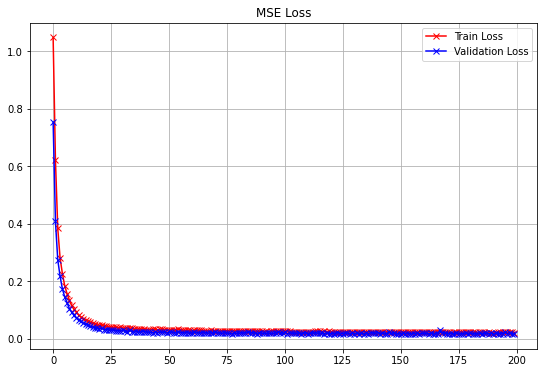

In [161]:
# Train Model
epoch = 200
dropout = 0.05
validation_split = 0.1
batch_size = 100
test_size=0.2
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=20)
basereport, basemodel, basehistory = base_model(epoch, batch_size, dropout, validation_split, test_size)
plot_loss_accuracy(basehistory)
basereport

In [ ]:
# Run Base Model Defining before to make sure correct X and Y data loaded
y_base_model = basemodel.predict(X)
y_base_model = yscaler.inverse_transform(y_base_model)
y_actual = yscaler.inverse_transform(Y)

y_actual_and_base = pd.DataFrame(y_actual, columns = ['Actual CHWTON/SQFT'])
y_actual_and_base['Baseline Predictions'] = y_base_model
date_time = x_df[['Date_Time','Month','Day','bldgname']].reset_index()
date_time['Time'] = date_time['Date_Time'].str[11:16]
date_time = date_time.reset_index().drop(columns=['index'])

y_actual_and_base = y_actual_and_base.join(date_time)

## Plot Predictions for User Input Month and Day for all Buildings

[5, 6, 7]
Please select month from options above: 5
[10 16 23 28]
Please select day from options above:  10


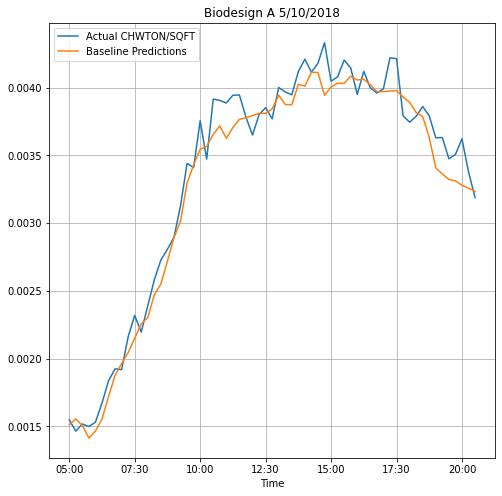

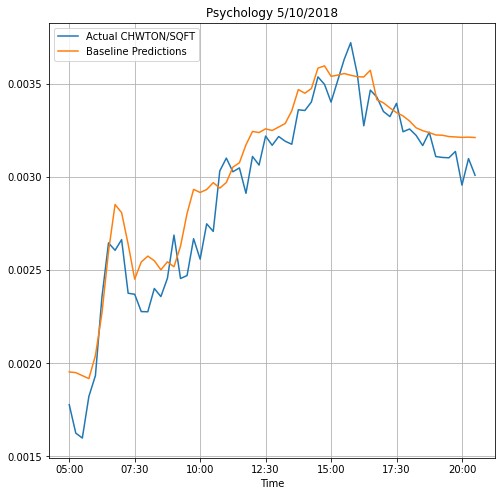

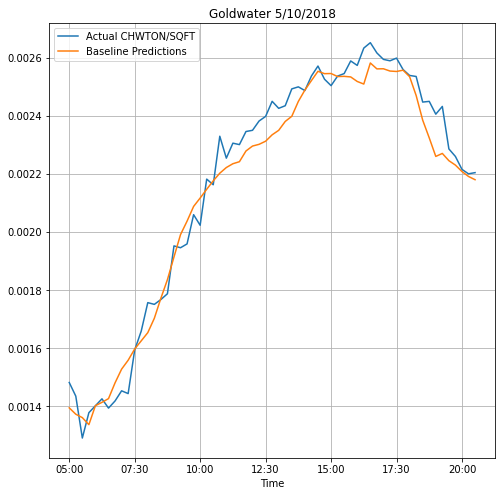

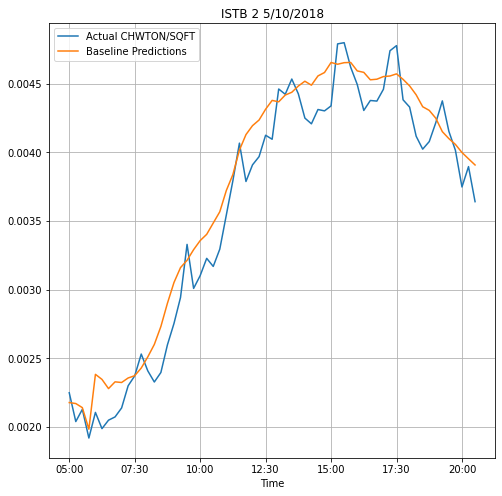

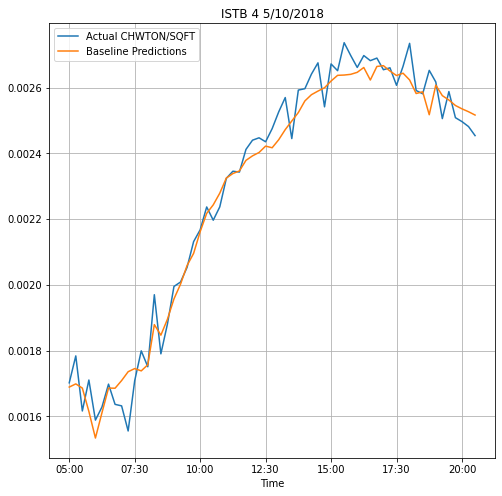

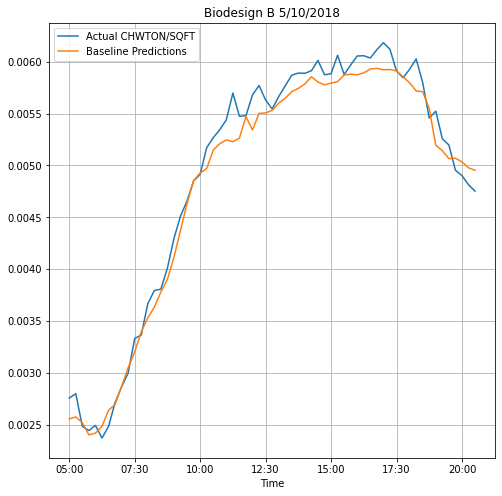

In [42]:
# Ask User to Enter Specific Day
print(list(y_actual_and_base['Month'].unique()))
m = int(input('Please select month from options above: '))
print(y_actual_and_base[y_actual_and_base['Month'] == m]['Day'].unique())
d = int(input('Please select day from options above:  '))

Buildings = y_actual_and_base['bldgname'].unique()
for bldg in Buildings:             
  month = y_actual_and_base.loc[y_actual_and_base['Month'] == m]
  day = month.loc[month['Day'] == d]
  bldg_ = day.loc[day['bldgname']==bldg]
  values = bldg_.sort_values(by=['Time'])          
  ax = values.plot(x='Time',y='Actual CHWTON/SQFT', figsize = (8,8))
  values.plot(x='Time',y='Baseline Predictions',figsize = (8,8),ax=ax)
  ax.set_title(bldg + ' ' + str(m) + '/' + str(d) + '/2018' )
  ax.grid(True)

## Save All Prediction Plots for all Days/Months


In [ ]:
### NO NEED TO RUN THIS CELL IF YOU DO NOT WANT TO SAVE RESULTS ###
# Create Models Folder if it Does not Exist
change_scen = int(input('enter [ 1 ] to change scenario:  '))
if change_scen == 1:
  plots_f = '/content/drive/Shareddrives/Microclimate-Building Energy/Plots'
  if os.path.exists(plots_f + '/Models') == False:
    os.mkdir(plots_f + '/Models')
  models_f = plots_f + '/Models/'

  features_name = input('Enter file name for features used: ')
  floc = models_f + features_name

  if os.path.exists(floc) == False:
    os.mkdir(floc)

  for i in ['May 2018', 'June 2018', 'July 2018', 'August 2018']:
    if os.path.exists(floc + '/' + str(i)) == False:
      os.mkdir(floc + '/' + str(i))
else: 
  pass

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

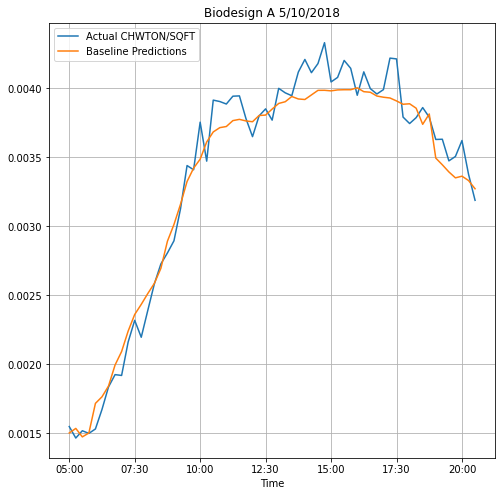

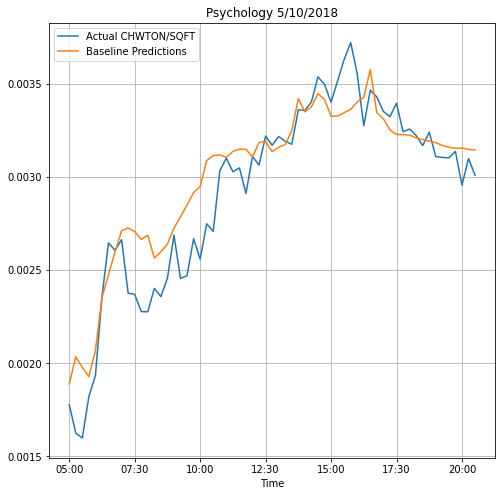

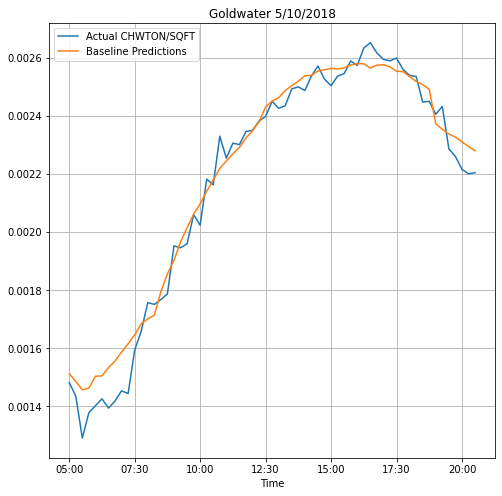

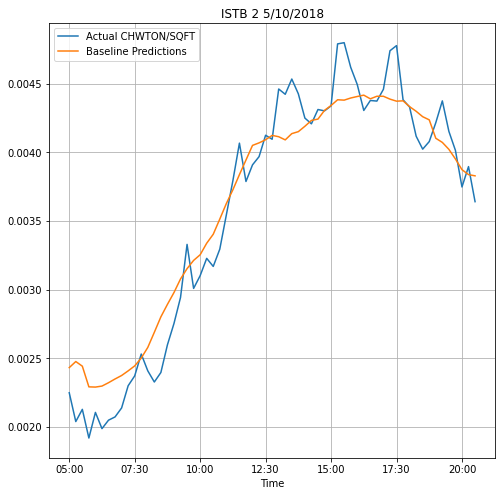

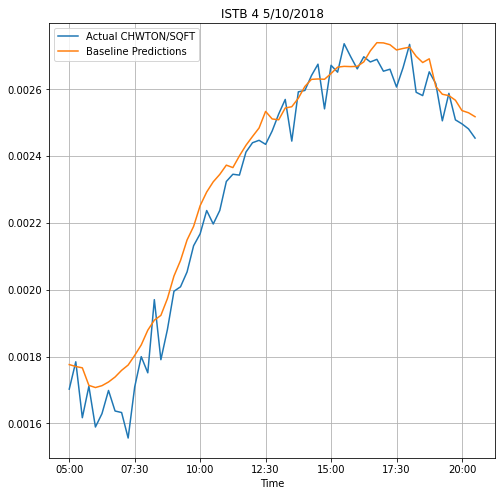

...

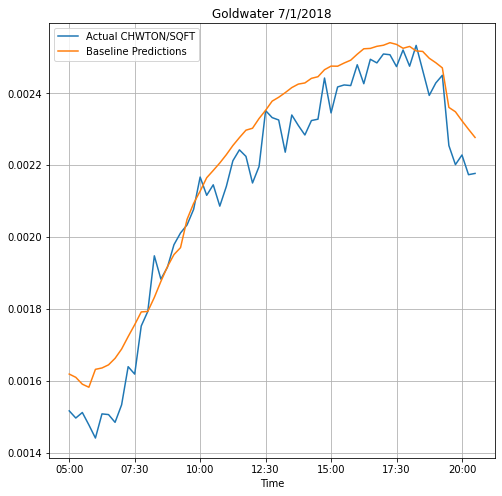

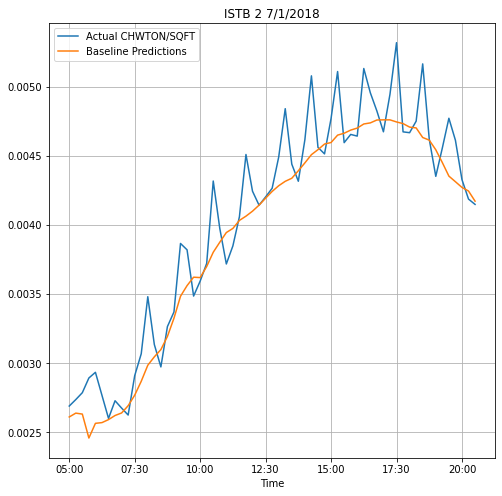

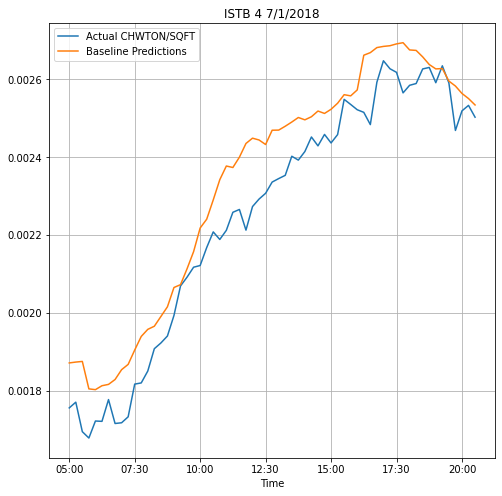

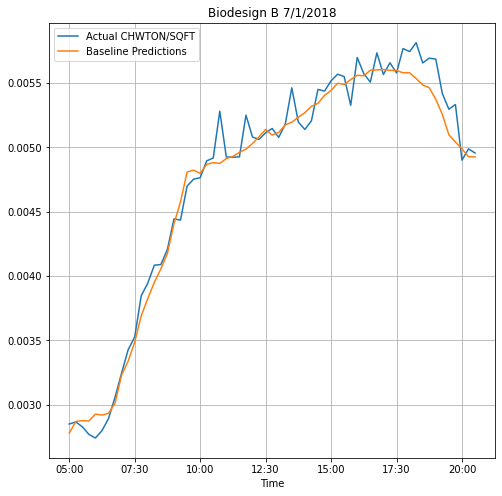

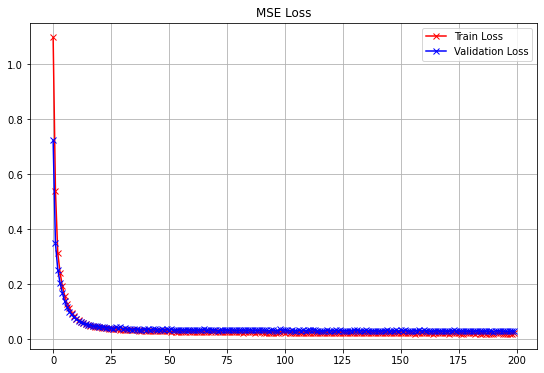

In [97]:
# Get unique months in dataset
unique_m = y_actual_and_base['Month'].unique()
Buildings = y_actual_and_base['bldgname'].unique()

# Loop Over Every Day in Data
for m,M in enumerate(unique_m):
  unique_d = y_actual_and_base[y_actual_and_base['Month'] == M]['Day'].unique()
  for d,D in enumerate(unique_d):
    # Check month and assign fname
    if str(M) == '5': fname = 'May 2018/'
    elif str(M) == '6': fname = 'June 2018/'
    elif str(M) == '7': fname = 'July 2018/'
    elif str(M) == '8': fname = 'August 2018/'
    for bldg in Buildings:               
      month = y_actual_and_base.loc[y_actual_and_base['Month'] == M]
      day = month.loc[month['Day'] == D]
      bldg_ = day.loc[day['bldgname']==bldg]
      values = bldg_.sort_values(by=['Time'])          
      ax = values.plot(x='Time',y='Actual CHWTON/SQFT', figsize = (8,8))
      values.plot(x='Time',y='Baseline Predictions',figsize = (8,8),ax=ax)
      ax.set_title(bldg + ' ' + str(M) + '/' + str(D) + '/2018' )
      ax.grid(True)
      #plt.savefig(floc + '/' + fname + bldg + ' ' + str(M) + '-' + str(D) + '-2018.png')
#basereport.to_csv(floc + '/Summary.csv')
plot_loss_accuracy(basehistory)
#plt.savefig(floc + '/epoch_' + str(epoch) + '_loss_curve.png')


## Regularization with Early Stop and Dropout

In [ ]:
data = []
allresults = pd.DataFrame()
for i in range(10):
  dropout = (i+1)*0.01
  for z in range(10):
    epoch = (z+1)*2
    validation_split = 0.1
    batch_size = 200
    test_size=0.2
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=20)
    report, model, history = base_model(epoch, batch_size, dropout, validation_split, test_size)
    r2 = round(float(report['R2 Score']), 3)
    RMSE = round(float(report['RMSE']),3)
    values = [dropout, epoch, r2, RMSE]
    zipped = zip(['Dropout', 'Epochs', 'R2 Score', 'RMSE'], values)
    a_dictionary = dict(zipped)
    data.append(a_dictionary)
allresults = allresults.append(data, True)

,Dropout,Epochs,R2 Score,RMSE
0,0.01,2,0.779,0.479
1,0.01,4,0.941,0.248
2,0.01,6,0.937,0.256
3,0.01,8,0.967,0.186
4,0.01,10,0.969,0.178
...,...,...,...,...
95,0.10,12,0.965,0.191
96,0.10,14,0.972,0.170
97,0.10,16,0.974,0.164
98,0.10,18,0.970,0.177


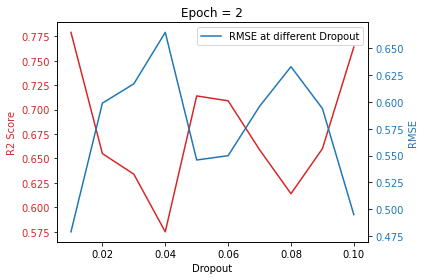

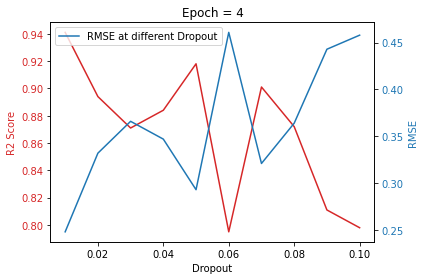

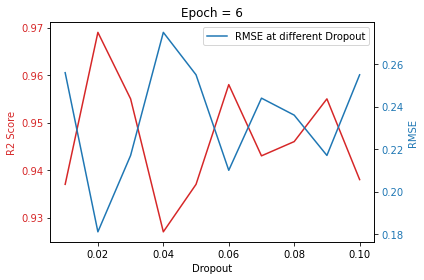

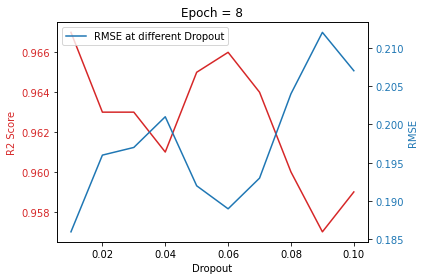

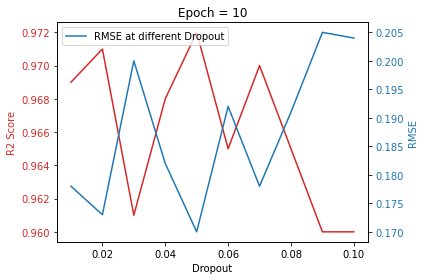

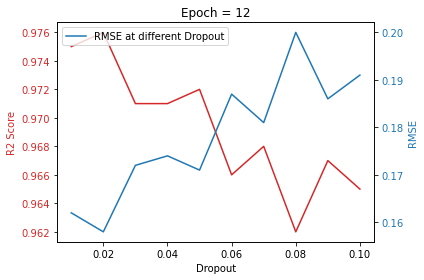

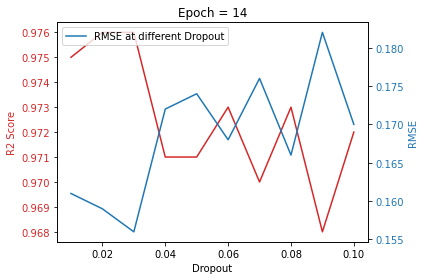

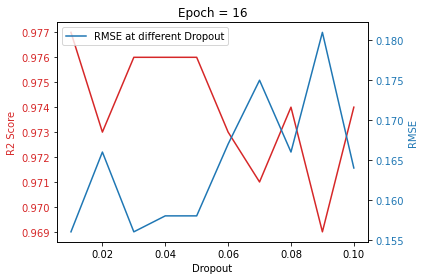

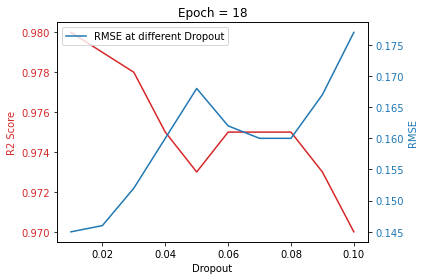

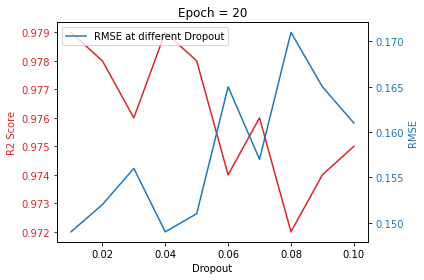

In [ ]:
if os.path.exists(floc + '/Regularization') == False:
  os.mkdir(floc + '/Regularization')
for z in range(10):
  epoch = (z+1)*2
  dropout_df = allresults[allresults['Epochs'] == epoch]

  fig, ax1 = plt.subplots()
  color = 'tab:red'
  ax1.set_xlabel('Dropout')
  ax1.set_ylabel('R2 Score', color=color)
  ax1.plot(dropout_df['Dropout'], dropout_df['R2 Score'], color=color, label='R2 at different Dropout')
  ax1.tick_params(axis='y', labelcolor=color)
  ax2 = ax1.twinx()
  color = 'tab:blue'
  ax2.set_ylabel('RMSE', color=color)
  ax2.plot(dropout_df['Dropout'], dropout_df['RMSE'], color=color, label='RMSE at different Dropout')
  ax2.tick_params(axis='y', labelcolor=color)
  plt.title('Epoch = ' + str(epoch))
  plt.legend()
  fig.tight_layout()

  # Save Figures
  plt.savefig(floc + '/Regularization/' + 'R2-RMSE-vs-dropout_for_epoch_' + str(epoch) + '.png')

allresults.to_csv(floc + '/Regularization/' + 'allresults.csv')
allresults

## Train/Validate and Test on Each Day

Epoch 1/50
18/18 [==============================] - 1s 17ms/step - loss: 1.2326 - mean_squared_error: 0.9595 - val_loss: 1.0523 - val_mean_squared_error: 0.8610
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.9374 - mean_squared_error: 0.7960 - val_loss: 0.8066 - val_mean_squared_error: 0.7351
Epoch 3/50
18/18 [==============================] - 0s 6ms/step - loss: 0.7179 - mean_squared_error: 0.6815 - val_loss: 0.5909 - val_mean_squared_error: 0.6329
Epoch 4/50
18/18 [==============================] - 0s 5ms/step - loss: 0.5421 - mean_squared_error: 0.5894 - val_loss: 0.4362 - val_mean_squared_error: 0.5464
Epoch 5/50
18/18 [==============================] - 0s 5ms/step - loss: 0.4101 - mean_squared_error: 0.5089 - val_loss: 0.3323 - val_mean_squared_error: 0.4744
Epoch 6/50
18/18 [==============================] - 0s 5ms/step - loss: 0.3284 - mean_squared_error: 0.4450 - val_loss: 0.2680 - val_mean_squared_error: 0.4173
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
18/18 [==============================] - 1s 16ms/step - loss: 1.0945 - mean_squared_error: 0.8457 - val_loss: 0.8552 - val_mean_squared_error: 0.6940
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.7146 - mean_squared_error: 0.6040 - val_loss: 0.5884 - val_mean_squared_error: 0.5243
Epoch 3/50
18/18 [==============================] - 0s 5ms/step - loss: 0.5286 - mean_squared_error: 0.4665 - val_loss: 0.4478 - val_mean_squared_error: 0.4179
Epoch 4/50
18/18 [==============================] - 0s 5ms/step - loss: 0.4321 - mean_squared_error: 0.3813 - val_loss: 0.3738 - val_mean_squared_error: 0.3493
Epoch 5/50
18/18 [==============================] - 0s 7ms/step - loss: 0.3782 - mean_squared_error: 0.3251 - val_loss: 0.3219 - val_mean_squared_error: 0.3034
Epoch 6/50
18/18 [==============================] - 0s 6ms/step - loss: 0.3296 - mean_squared_error: 0.2857 - val_loss: 0.2833 - val_mean_squared_error: 0.2696
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
18/18 [==============================] - 1s 19ms/step - loss: 1.1757 - mean_squared_error: 0.9451 - val_loss: 0.8840 - val_mean_squared_error: 0.7794
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.7047 - mean_squared_error: 0.6657 - val_loss: 0.5322 - val_mean_squared_error: 0.5674
Epoch 3/50
18/18 [==============================] - 0s 5ms/step - loss: 0.4802 - mean_squared_error: 0.4964 - val_loss: 0.3708 - val_mean_squared_error: 0.4357
Epoch 4/50
18/18 [==============================] - 0s 6ms/step - loss: 0.3662 - mean_squared_error: 0.3902 - val_loss: 0.3043 - val_mean_squared_error: 0.3515
Epoch 5/50
18/18 [==============================] - 0s 5ms/step - loss: 0.3098 - mean_squared_error: 0.3223 - val_loss: 0.2588 - val_mean_squared_error: 0.2968
Epoch 6/50
18/18 [==============================] - 0s 5ms/step - loss: 0.2663 - mean_squared_error: 0.2765 - val_loss: 0.2249 - val_mean_squared_error: 0.2583
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
18/18 [==============================] - 1s 18ms/step - loss: 1.2175 - mean_squared_error: 0.9420 - val_loss: 1.0344 - val_mean_squared_error: 0.8297
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.8889 - mean_squared_error: 0.7569 - val_loss: 0.7705 - val_mean_squared_error: 0.6902
Epoch 3/50
18/18 [==============================] - 0s 5ms/step - loss: 0.6824 - mean_squared_error: 0.6416 - val_loss: 0.5625 - val_mean_squared_error: 0.5898
Epoch 4/50
18/18 [==============================] - 0s 6ms/step - loss: 0.4927 - mean_squared_error: 0.5451 - val_loss: 0.3743 - val_mean_squared_error: 0.5017
Epoch 5/50
18/18 [==============================] - 0s 5ms/step - loss: 0.3543 - mean_squared_error: 0.4636 - val_loss: 0.2690 - val_mean_squared_error: 0.4279
Epoch 6/50
18/18 [==============================] - 0s 5ms/step - loss: 0.2741 - mean_squared_error: 0.3978 - val_loss: 0.2205 - val_mean_squared_error: 0.3706
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
18/18 [==============================] - 1s 16ms/step - loss: 1.2022 - mean_squared_error: 0.9698 - val_loss: 1.0096 - val_mean_squared_error: 0.8197
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.9204 - mean_squared_error: 0.7600 - val_loss: 0.7831 - val_mean_squared_error: 0.7004
Epoch 3/50
18/18 [==============================] - 0s 5ms/step - loss: 0.6884 - mean_squared_error: 0.6518 - val_loss: 0.5194 - val_mean_squared_error: 0.5946
Epoch 4/50
18/18 [==============================] - 0s 5ms/step - loss: 0.4927 - mean_squared_error: 0.5457 - val_loss: 0.3880 - val_mean_squared_error: 0.5017
Epoch 5/50
18/18 [==============================] - 0s 5ms/step - loss: 0.3843 - mean_squared_error: 0.4648 - val_loss: 0.3068 - val_mean_squared_error: 0.4309
Epoch 6/50
18/18 [==============================] - 0s 5ms/step - loss: 0.3098 - mean_squared_error: 0.4021 - val_loss: 0.2578 - val_mean_squared_error: 0.3762
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
18/18 [==============================] - 1s 16ms/step - loss: 1.1347 - mean_squared_error: 0.8337 - val_loss: 0.9943 - val_mean_squared_error: 0.7541
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.8948 - mean_squared_error: 0.7040 - val_loss: 0.7779 - val_mean_squared_error: 0.6563
Epoch 3/50
18/18 [==============================] - 0s 5ms/step - loss: 0.7328 - mean_squared_error: 0.6184 - val_loss: 0.6315 - val_mean_squared_error: 0.5832
Epoch 4/50
18/18 [==============================] - 0s 5ms/step - loss: 0.5916 - mean_squared_error: 0.5523 - val_loss: 0.4755 - val_mean_squared_error: 0.5199
Epoch 5/50
18/18 [==============================] - 0s 5ms/step - loss: 0.4296 - mean_squared_error: 0.4873 - val_loss: 0.3337 - val_mean_squared_error: 0.4557
Epoch 6/50
18/18 [==============================] - 0s 6ms/step - loss: 0.3208 - mean_squared_error: 0.4267 - val_loss: 0.2550 - val_mean_squared_error: 0.3994
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
18/18 [==============================] - 1s 17ms/step - loss: 1.1702 - mean_squared_error: 0.8345 - val_loss: 1.0229 - val_mean_squared_error: 0.7873
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.9297 - mean_squared_error: 0.7395 - val_loss: 0.7881 - val_mean_squared_error: 0.6916
Epoch 3/50
18/18 [==============================] - 0s 6ms/step - loss: 0.7131 - mean_squared_error: 0.6471 - val_loss: 0.5581 - val_mean_squared_error: 0.6009
Epoch 4/50
18/18 [==============================] - 0s 5ms/step - loss: 0.4999 - mean_squared_error: 0.5560 - val_loss: 0.3902 - val_mean_squared_error: 0.5114
Epoch 5/50
18/18 [==============================] - 0s 5ms/step - loss: 0.3737 - mean_squared_error: 0.4736 - val_loss: 0.2992 - val_mean_squared_error: 0.4388
Epoch 6/50
18/18 [==============================] - 0s 5ms/step - loss: 0.2991 - mean_squared_error: 0.4092 - val_loss: 0.2544 - val_mean_squared_error: 0.3830
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
18/18 [==============================] - 1s 15ms/step - loss: 1.1487 - mean_squared_error: 0.8447 - val_loss: 0.9890 - val_mean_squared_error: 0.7601
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.9262 - mean_squared_error: 0.7188 - val_loss: 0.8079 - val_mean_squared_error: 0.6735
Epoch 3/50
18/18 [==============================] - 0s 5ms/step - loss: 0.7406 - mean_squared_error: 0.6349 - val_loss: 0.5935 - val_mean_squared_error: 0.5964
Epoch 4/50
18/18 [==============================] - 0s 5ms/step - loss: 0.5320 - mean_squared_error: 0.5552 - val_loss: 0.3999 - val_mean_squared_error: 0.5146
Epoch 5/50
18/18 [==============================] - 0s 5ms/step - loss: 0.3852 - mean_squared_error: 0.4773 - val_loss: 0.2950 - val_mean_squared_error: 0.4428
Epoch 6/50
18/18 [==============================] - 0s 6ms/step - loss: 0.2978 - mean_squared_error: 0.4127 - val_loss: 0.2378 - val_mean_squared_error: 0.3854
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
19/19 [==============================] - 1s 15ms/step - loss: 1.1852 - mean_squared_error: 0.8958 - val_loss: 0.9559 - val_mean_squared_error: 0.7899
Epoch 2/50
19/19 [==============================] - 0s 5ms/step - loss: 0.8075 - mean_squared_error: 0.7085 - val_loss: 0.5946 - val_mean_squared_error: 0.6210
Epoch 3/50
19/19 [==============================] - 0s 5ms/step - loss: 0.5438 - mean_squared_error: 0.5527 - val_loss: 0.4195 - val_mean_squared_error: 0.4920
Epoch 4/50
19/19 [==============================] - 0s 5ms/step - loss: 0.4154 - mean_squared_error: 0.4460 - val_loss: 0.3322 - val_mean_squared_error: 0.4057
Epoch 5/50
19/19 [==============================] - 0s 5ms/step - loss: 0.3405 - mean_squared_error: 0.3739 - val_loss: 0.2822 - val_mean_squared_error: 0.3460
Epoch 6/50
19/19 [==============================] - 0s 5ms/step - loss: 0.2893 - mean_squared_error: 0.3233 - val_loss: 0.2422 - val_mean_squared_error: 0.3028
Epoch 7/50
19/19 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

Epoch 1/50
18/18 [==============================] - 1s 16ms/step - loss: 1.2105 - mean_squared_error: 0.8890 - val_loss: 0.9820 - val_mean_squared_error: 0.8187
Epoch 2/50
18/18 [==============================] - 0s 5ms/step - loss: 0.8446 - mean_squared_error: 0.7397 - val_loss: 0.6093 - val_mean_squared_error: 0.6560
Epoch 3/50
18/18 [==============================] - 0s 5ms/step - loss: 0.5319 - mean_squared_error: 0.5799 - val_loss: 0.4025 - val_mean_squared_error: 0.5109
Epoch 4/50
18/18 [==============================] - 0s 5ms/step - loss: 0.3952 - mean_squared_error: 0.4582 - val_loss: 0.3257 - val_mean_squared_error: 0.4137
Epoch 5/50
18/18 [==============================] - 0s 4ms/step - loss: 0.3317 - mean_squared_error: 0.3792 - val_loss: 0.2777 - val_mean_squared_error: 0.3499
Epoch 6/50
18/18 [==============================] - 0s 6ms/step - loss: 0.2872 - mean_squared_error: 0.3260 - val_loss: 0.2378 - val_mean_squared_error: 0.3050
Epoch 7/50
18/18 [=====================

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

,Day Removed,Validation R2,Test Day R2
0,5/10,0.973951,0.960284
1,5/16,0.977349,0.960840
2,5/23,0.981435,0.926307
3,5/28,0.976051,0.931856
4,6/7,0.970060,0.966016
5,6/8,0.973628,0.969825
6,6/9,0.967388,0.965346
7,6/20,0.967412,0.978733
8,6/21,0.963276,0.981524
9,6/25,0.967754,0.971291


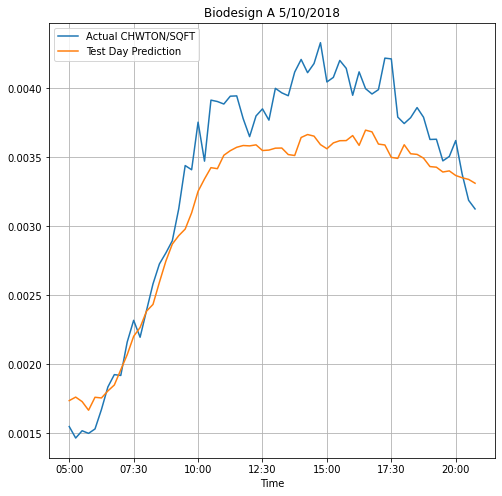

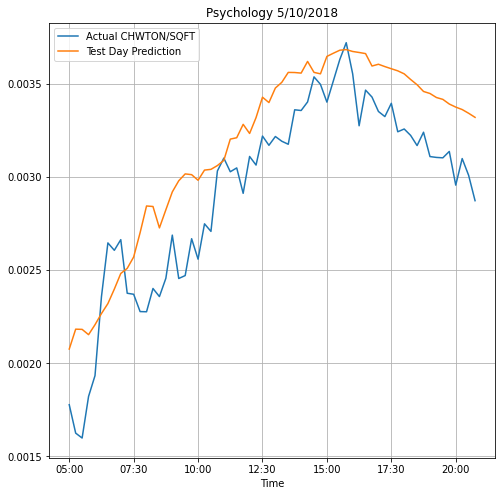

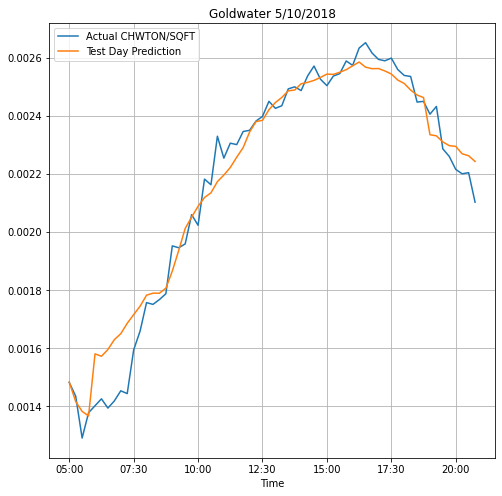

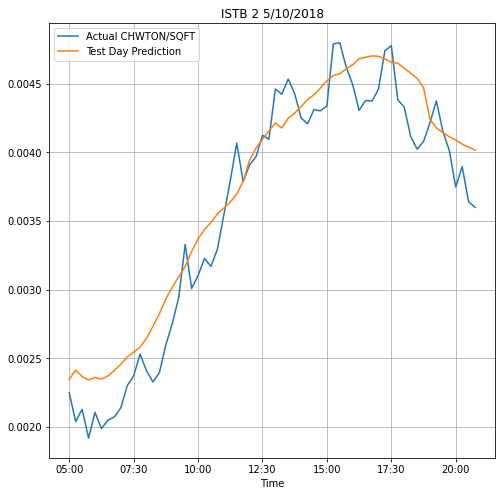

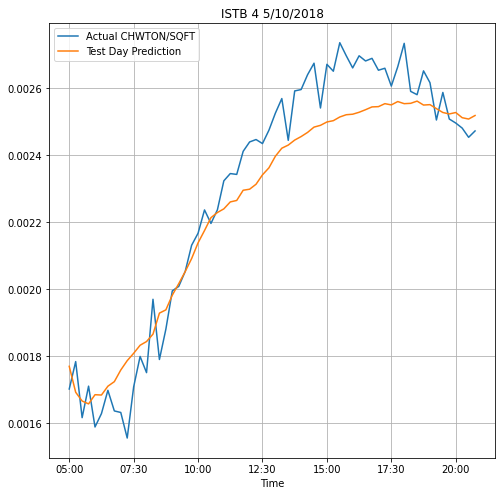

...

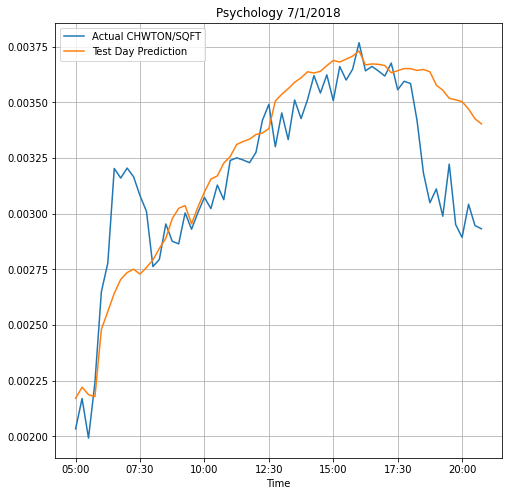

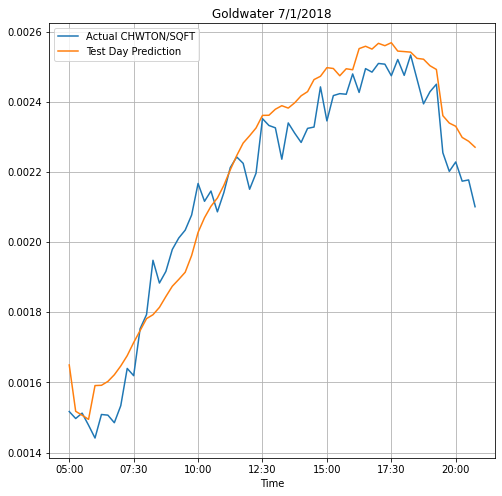

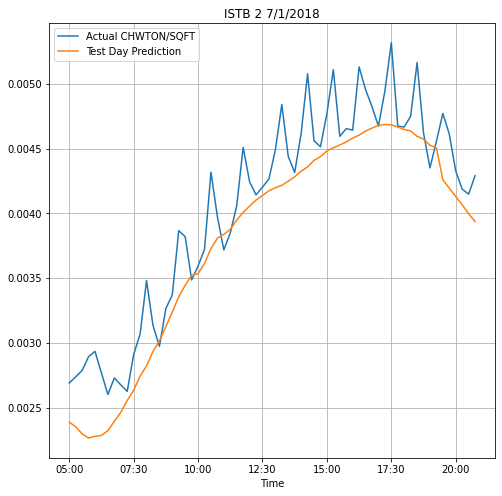

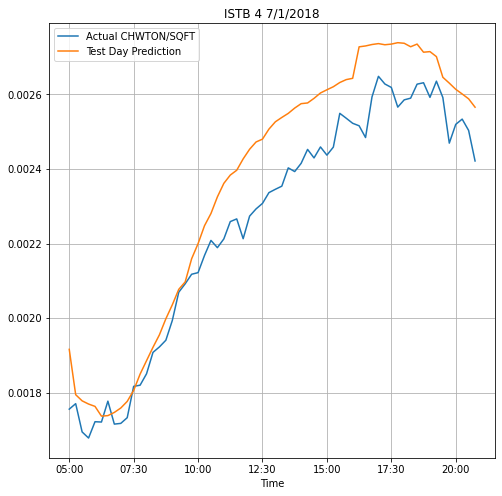

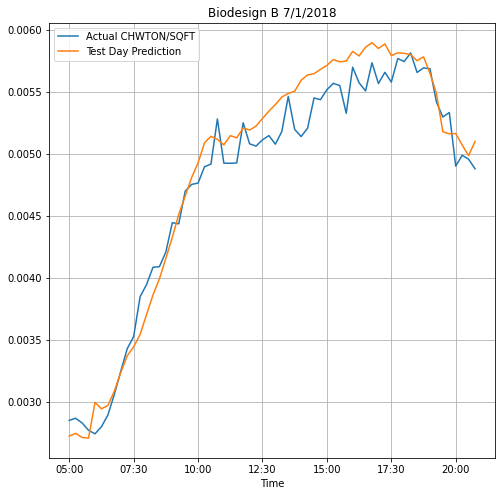

In [165]:
# if os.path.exists(floc + '/One-Day-Test') == False: 
#   os.mkdir(floc + '/One-Day-Test')
# Define Empty List
data = []
# Get X and Y from original data and attach date and time
X_one = X[X.columns[:-6]].join(undummify(X[X.columns[-6:]]))
X_one = X_one.reset_index().join(date_time[['Month', 'Day','Time','Date_Time']]).drop(columns=['index'])
Y_one = pd.DataFrame(Y).reset_index().join(date_time)
Y_one = Y_one.rename(columns={0: "CHWTON/SQFT"})
# Get unique months in dataset
unique_m = X_one['Month'].unique()

# Loop Over Every Day in Data
for m,M in enumerate(unique_m):
  unique_d = X_one[X_one['Month'] == M]['Day'].unique()
  for d,D in enumerate(unique_d):

    # Copy original data, save current day to df_test, remove current day from df
    Xdf = X_one.copy()
    Ydf = Y_one.copy()
    Xdf_test = Xdf[(Xdf['Month']==M) & (Xdf['Day']==D)]
    Ydf_test = Ydf[(Ydf['Month']==M) & (Ydf['Day']==D)]
    Xdf.drop(Xdf[(Xdf['Month']==M) & (Xdf['Day']==D)].index, inplace = True)
    Ydf.drop(Ydf[(Ydf['Month']==M) & (Ydf['Day']==D)].index, inplace = True)

    # Return X to original state
    X_ = pd.get_dummies(Xdf.drop(columns = ['Month', 'Day','Time','Date_Time']))
    X_test_day = pd.get_dummies(Xdf_test.drop(columns = ['Month', 'Day','Time','Date_Time']))

    # Define Y for train/validate and Y_test_day for testing
    Y_ = Ydf['CHWTON/SQFT']
    Y_ = Y_.values.reshape(-1, 1)
    Y_test_day = Ydf_test['CHWTON/SQFT']
    Y_test_day = Y_test_day.values.reshape(-1, 1)

    # Split Data Into Train/Test --> note: X_test/y_test here is used for validation since we are testing on removed day
    X_train, X_test, y_train, y_test = train_test_split(X_, Y_, test_size=0.1, random_state=20)

    # Train Model
    epoch = 50
    dropout = 0.05
    validation_split = 0.1
    batch_size = 200
    test_size=0.2 
    report, model, history = base_model(epoch, batch_size, dropout, validation_split, test_size)
 
    # Predict test day 
    y_day_preds = model.predict(X_test_day)
    # Save validation and test day R2 and RMSE scores
    RMSE_day = np.sqrt(metrics.mean_squared_error(Y_test_day, y_day_preds))
    R2_score_day = metrics.r2_score(Y_test_day, y_day_preds) 
    data.append([str(M) + '/' + str(D), float(report['R2 Score']), R2_score_day])  
    print('Epoch Complete')

    # Preparing data for plotting
    dt = Xdf_test[['Date_Time','Month','Day']]
    res = undummify(X_test_day).join(dt)
    Y_actual = yscaler.inverse_transform(Y_test_day)
    res['Actual CHWTON/SQFT'] = Y_actual
    res['Time'] = res['Date_Time'].str[11:16]
    res['Test Day Prediction'] = yscaler.inverse_transform(y_day_preds)  

    # Plotting results for all days for each building   
    Buildings = res['bldgname'].unique()
    for bldg in Buildings:
      month = res.loc[res['Month'] == M]
      day = month.loc[month['Day'] == D]
      bldg_ = day.loc[res['bldgname']==bldg]
      values = bldg_.sort_values(by=['Time'])          
      ax = values.plot(x='Time',y='Actual CHWTON/SQFT', figsize = (8,8))
      values.plot(x='Time',y='Test Day Prediction',figsize = (8,8),ax=ax)
      ax.set_title(bldg + ' ' + str(M) + '/' + str(D) + '/2018' )
      ax.grid(True)
      #plt.savefig(floc + '/One-Day-Test/' + bldg + '_' + str(M) + '-' + str(D) + '-2018.png', bbox_inches='tight')
column_names = ["Day Removed", "Validation R2", "Test Day R2"]
results = pd.DataFrame(data, columns = column_names)
results
#results.to_csv(floc + '/One-Day-Test/Summary.csv')

In [166]:
results

,Day Removed,Validation R2,Test Day R2
0,5/10,0.973951,0.960284
1,5/16,0.977349,0.960840
2,5/23,0.981435,0.926307
3,5/28,0.976051,0.931856
4,6/7,0.970060,0.966016
5,6/8,0.973628,0.969825
6,6/9,0.967388,0.965346
7,6/20,0.967412,0.978733
8,6/21,0.963276,0.981524
9,6/25,0.967754,0.971291


# **Sensitivity Analysis**

In [ ]:
### NO NEED TO RUN THIS CELL IF YOU DO NOT WANT TO SAVE RESULTS ###
# Create Sensitivity Analysis Folder if it Does not Exist
if os.path.exists(floc + '/Sensitivity Analysis') == False:
  os.mkdir(floc + '/Sensitivity Analysis')

## Define Scenario and Create Output Files

In [167]:
## Run this cell to remove some buildings 

Data_Sens = Data[(Data['bldgname'] != 'Bulldog Hall') 
                & (Data['bldgname'] != 'Psychology North') 
                & (Data['bldgname'] != 'Noble Library')
                & (Data['bldgname'] != 'Biodesign C')
                & (Data['bldgname'] != 'Schwada COB')]

Data_Sens = Data_Sens[Data_Sens['Month'] != 8]

In [168]:
# Ask user to input microclimate modifications
shadered = float(input('Shade to add (0 - 1): '))
airtempred = float(input('Air Temperature Reduction (C) (1 = -1C): '))
abshumred = float(input('Absolute Humidity Reduction: '))
scenname = scenarios[feat_type - 1]
unique_id = "( " + str(airtempred) + "C, " + str(abshumred) + "AH, " + str(shadered) + "S )"

# Get Shade Scenarios Ready
# West Facade
WestShade = Data_Sens.copy()
WestShade = change_shade(WestShade, [shadered], ['Shade West'])
# East Facade
EastShade = Data_Sens.copy()
EastShade = change_shade(EastShade, [shadered], ['Shade East'])
# North Facade
NorthShade = Data_Sens.copy()
NorthShade = change_shade(NorthShade, [shadered], ['Shade North'])
# Sourth Facade
SouthShade = Data_Sens.copy()
SouthShade = change_shade(SouthShade, [shadered], ['Shade South'])
# All Facades
AllShade = Data_Sens.copy()
AllShade = change_shade(AllShade, shadered, 'All')

# Get Air Temp Scenario Ready
AirTempRed = Data_Sens.copy()
AirTempRed['Air Temp'] = AirTempRed['Air Temp'] - airtempred

# Get Abs Hum Scenario Ready
AbsHumRed = Data_Sens.copy()
AbsHumRed['Abs Hum'] = AbsHumRed['Abs Hum'] - abshumred

# Get All Combined Scenario Ready
AllCombined = AllShade.copy()
AllCombined['Air Temp'] = AllCombined['Air Temp'] - airtempred
AllCombined['Abs Hum'] = AllCombined['Abs Hum'] - abshumred

Shade to add (0 - 1): 0.5
Air Temperature Reduction (C) (1 = -1C): 1
Absolute Humidity Reduction: 1


In [169]:
scendic = {
  "1": "Increase Shade West " + str(shadered),
  "2": "Increase Shade East " + str(shadered),
  "3": "Increase Shade North " + str(shadered),
  "4": "Increase Shade South " + str(shadered),
  "5": "Increase Shade All " + str(shadered),
  "6": "Increase Air Temp " + str(airtempred) + "C",
  "7": "Increase Abs Hum " + str(abshumred),
  "8": "All Scenarios Combined " + "( " + str(airtempred) + "C, " + str(abshumred) + "AH, " + str(shadered) + "S )",
}

print('THE FOLLOWING SCENARIOS WILL BE MODELED:')
for i in scendic: 
  print('[', i, ']', scendic[i])


### UNCOMMENT IF YOU WANT TO CREATE DIRECTORIES FOR RESULTS ###
'''
unique_floc = floc + '/Sensitivity Analysis/' + unique_id

# Create Scenario Files with Date Files if they Do not Exist
if os.path.exists(unique_floc) == False:
  os.mkdir(unique_floc)

  for z in scendic:
    os.mkdir(floc + '/Sensitivity Analysis/' + unique_id + '/' + str(scendic[z]))
    for i in ['May 2018', 'June 2018', 'July 2018', 'August 2018']:
      os.mkdir(floc + '/Sensitivity Analysis/' + unique_id + '/' + str(scendic[z]) + '/' + str(i))
'''

THE FOLLOWING SCENARIOS WILL BE MODELED:
[ 1 ] Increase Shade West 0.5
[ 2 ] Increase Shade East 0.5
[ 3 ] Increase Shade North 0.5
[ 4 ] Increase Shade South 0.5
[ 5 ] Increase Shade All 0.5
[ 6 ] Increase Air Temp 1.0C
[ 7 ] Increase Abs Hum 1.0
[ 8 ] All Scenarios Combined ( 1.0C, 1.0AH, 0.5S )


"\nunique_floc = floc + '/Sensitivity Analysis/' + unique_id\n\n# Create Scenario Files with Date Files if they Do not Exist\nif os.path.exists(unique_floc) == False:\n  os.mkdir(unique_floc)\n\n  for z in scendic:\n    os.mkdir(floc + '/Sensitivity Analysis/' + unique_id + '/' + str(scendic[z]))\n    for i in ['May 2018', 'June 2018', 'July 2018', 'August 2018']:\n      os.mkdir(floc + '/Sensitivity Analysis/' + unique_id + '/' + str(scendic[z]) + '/' + str(i))\n"

In [170]:
scenlist = []
for ScenData in [WestShade, EastShade, NorthShade, SouthShade, AllShade, AirTempRed, AbsHumRed, AllCombined]:
  # Copy Original Data
  Data_Scaled = ScenData.copy()
  #Data_Scaled = Data_Scaled.drop(columns = ['KW', 'HTmmBTU'])
  # Replace Shade and DSW Columns
  Data_Scaled = Data_Scaled.drop(columns = ogcols)
  Data_Scaled[cols] = ScenData[cols]
  # Add Squared and Interactions Terms
  if sq_terms == 1:
    Data_Scaled = square_terms(Data_Scaled, ['Air Temp', 'Abs Hum'])
  if int_terms == 1:
    Data_Scaled = interaction_terms(Data_Scaled, ['Air Temp', 'Abs Hum'])
  # Sum Columns into One
  if sum_cols == 1:
    # Get Shade Columns
    shadecols = ['Shade North', 'Shade East', 'Shade West', 'Shade South']
    # Get sum of all shade columns
    if (feat_type == 1) or (feat_type == 2):
      Data_Scaled['Shade Sum'] = Data_Scaled[shadecols].sum(axis=1)
      Data_Scaled = Data_Scaled.drop(columns = shadecols)
    # Get DSW Columns
    DSWcols = ['DSW North', 'DSW East', 'DSW West', 'DSW South']
    # Get sum of all DSW columns
    if (feat_type == 1) or (feat_type == 3):
      Data_Scaled['DSW Sum'] = Data_Scaled[DSWcols].sum(axis=1)
      Data_Scaled = Data_Scaled.drop(columns = DSWcols)
  # Drop Columns
  Data_Scaled = Data_Scaled.drop(columns = ['CHWTON', 'Rel Hum'])
  # Assign columns to shift
  shiftcols = list(Data_Scaled.columns[6:])
  shiftcols.remove('CHWTON/SQFT')
  # Perform Data Shift for each building and dropna
  buildings = Data_Scaled['bldgname'].unique()
  x_list = []
  y_list = []
  # Get unique months in dataset
  unique_m = Data_Scaled['Month'].unique()
  # Loop Over Every Day in Data
  for m,M in enumerate(unique_m):
    unique_d = Data_Scaled[Data_Scaled['Month'] == M]['Day'].unique()
    for d,D in enumerate(unique_d):
      for b,B in enumerate(buildings):
        bldg_df = Data_Scaled[Data_Scaled['bldgname']== B].copy()
        month = bldg_df.loc[bldg_df['Month'] == M]
        day = month.loc[month['Day'] == D]
        xday = time_shift(day, shift_, shiftcols)
        xday = xday.dropna()
        yday = xday.pop('CHWTON/SQFT')
        x_list.append(xday)
        y_list.append(yday)
  x_df = x_list[0]
  y_df = y_list[0]
  for i in range(len(x_list)-1):
    x_df = x_df.append(x_list[i+1])
    y_df = y_df.append(y_list[i+1])

  # Scale X Data
  xcols = x_df.columns[6:]
  x_df[xcols] = xscaler.transform(x_df[xcols])
  # Use to rearrange X data
  bldg_cols = ['bldgname_Biodesign A', 'bldgname_Biodesign B', 'bldgname_Biodesign C',
                'bldgname_Bulldog Hall', 'bldgname_Goldwater', 'bldgname_ISTB 2',
                'bldgname_ISTB 4', 'bldgname_Noble Library', 'bldgname_Psychology',
                'bldgname_Psychology North', 'bldgname_Schwada COB']
  # Assign X
  Xsens = x_df[xcols]
  Xsens['bldgname'] = x_df['bldgname']
  Xsens = pd.get_dummies(Xsens)

  # Assign Y 
  Ysens = y_df
  Ysens = Ysens.values.reshape(-1, 1)
  Ysens = yscaler.transform(Ysens)

  XY = [Xsens, Ysens]
  scenlist.append(XY)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

## Prepare Base and Sensitivity Predictions and Actual CHWTON/SQFT Data

In [171]:
# Run Base Model Defining before to make sure correct X and Y data loaded
y_base_model = basemodel.predict(X)
y_base_model = yscaler.inverse_transform(y_base_model)
y_actual = yscaler.inverse_transform(Y)

y_actual_and_base = pd.DataFrame(y_actual, columns = ['Actual CHWTON/SQFT'])
y_actual_and_base['Baseline Predictions'] = y_base_model
date_time = x_df[['Date_Time','Month','Day','bldgname']].reset_index()
date_time['Time'] = date_time['Date_Time'].str[11:16]

y_actual_and_base = y_actual_and_base.join(date_time)

SensResults = []
for i in range(len(scenlist)):
  X_sens = scenlist[i][0]
  Y_sens = scenlist[i][1]
  y_sens_pred = basemodel.predict(X_sens)
  y_sens_pred = yscaler.inverse_transform(y_sens_pred)
  y_sens_res = pd.DataFrame(y_sens_pred, columns = ['Sensitivity Predictions']).join(y_actual_and_base)
  SensResults.append(y_sens_res)

## Choose Sensitivity Scenario and Plot

In [172]:
for i in scendic: 
  print('[', i, ']', scendic[i])
i = int(input('Enter number of sensitivity analysis to plot:  ')) - 1
print(scendic[str(i + 1)])

[ 1 ] Increase Shade West 0.5
[ 2 ] Increase Shade East 0.5
[ 3 ] Increase Shade North 0.5
[ 4 ] Increase Shade South 0.5
[ 5 ] Increase Shade All 0.5
[ 6 ] Increase Air Temp 1.0C
[ 7 ] Increase Abs Hum 1.0
[ 8 ] All Scenarios Combined ( 1.0C, 1.0AH, 0.5S )
Enter number of sensitivity analysis to plot:  2
Increase Shade East 0.5


/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

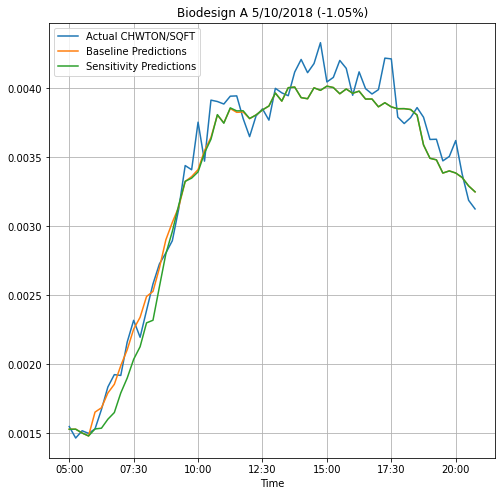

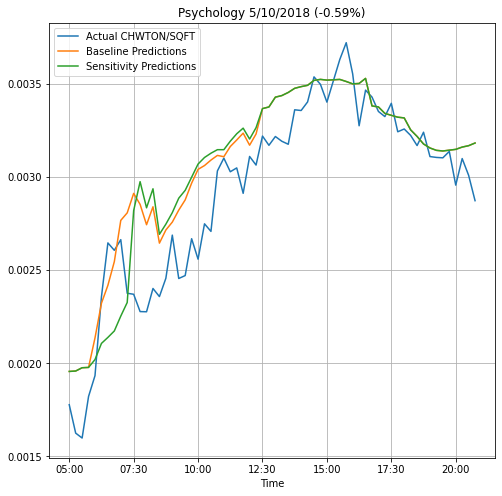

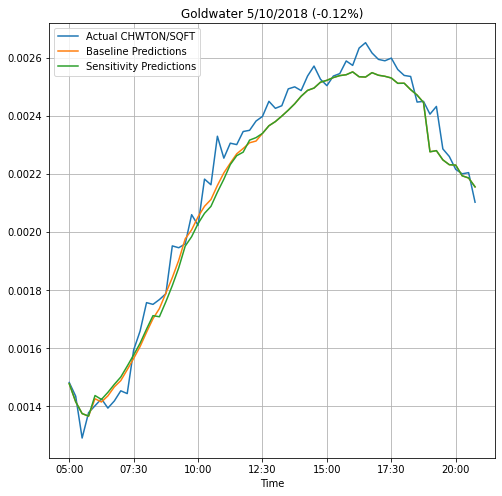

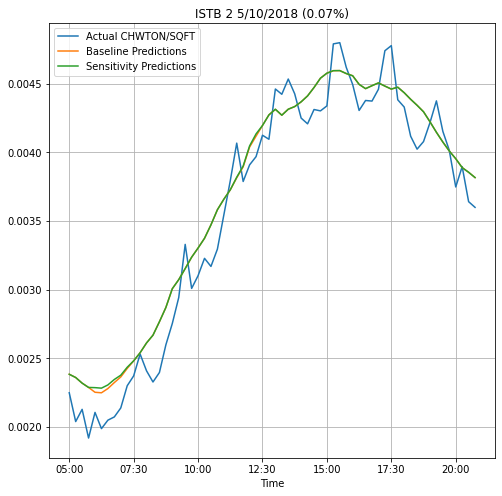

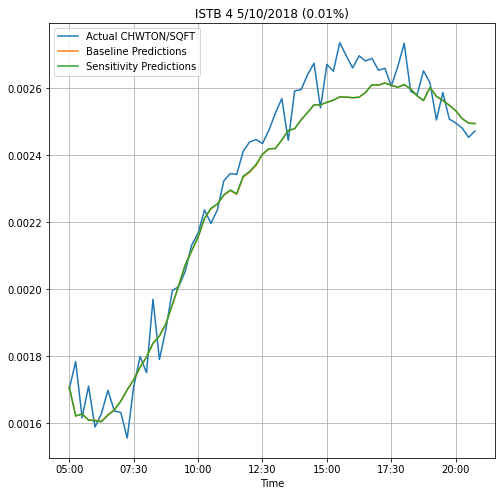

...

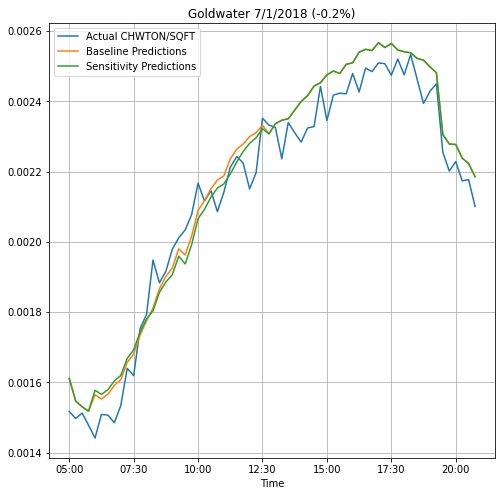

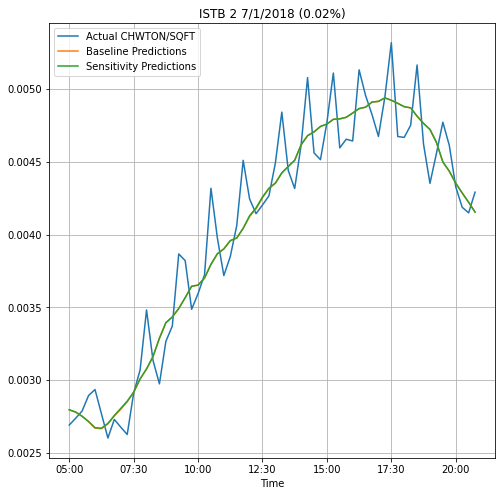

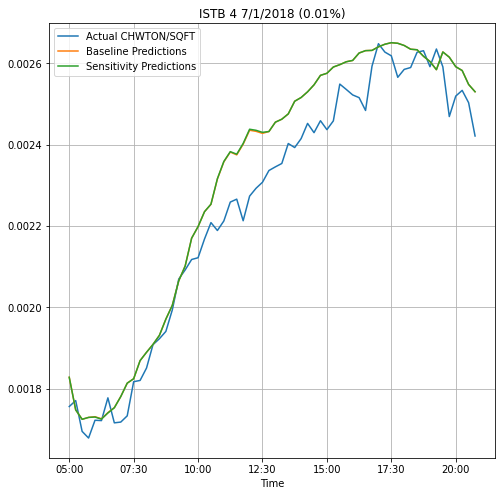

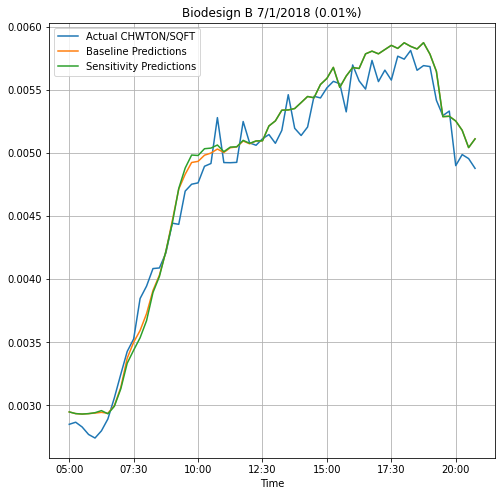

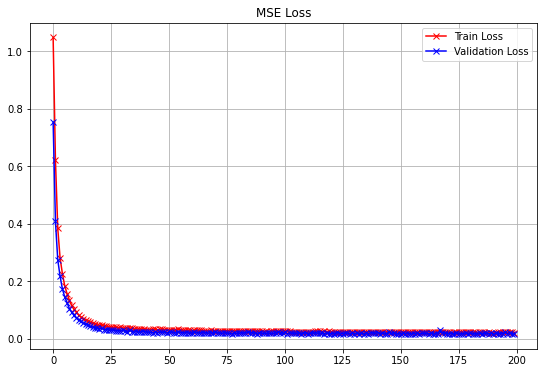

In [173]:
# Get unique months in dataset
unique_m = SensResults[i]['Month'].unique()
Buildings = SensResults[i]['bldgname'].unique()

# Loop Over Every Day in Data
for m,M in enumerate(unique_m):
  unique_d = SensResults[i][SensResults[i]['Month'] == M]['Day'].unique()
  for d,D in enumerate(unique_d):
    # Check month and assign fname
    if str(M) == '5': fname = 'May 2018/'
    elif str(M) == '6': fname = 'June 2018/'
    elif str(M) == '7': fname = 'July 2018/'
    elif str(M) == '8': fname = 'August 2018/'
    for bldg in Buildings:               
      month = SensResults[i].loc[SensResults[i]['Month'] == M]
      day = month.loc[month['Day'] == D]
      bldg_ = day.loc[day['bldgname']==bldg]
      values = bldg_.sort_values(by=['Time']) 
      x1 = values['Baseline Predictions'].sum()
      x2 = values['Sensitivity Predictions'].sum()
      percent_change = 100*((x2 - x1)/x1)
      label1 = str(round(percent_change,2)) + '%'
      ax = values.plot(x='Time',y='Actual CHWTON/SQFT', figsize = (8,8))
      values.plot(x='Time',y='Baseline Predictions',figsize = (8,8),ax=ax)
      values.plot(x='Time',y='Sensitivity Predictions',figsize = (8,8),ax=ax)
      ax.set_title(bldg + ' ' + str(M) + '/' + str(D) + '/2018' + ' (' + label1 + ')')
      ax.grid(True)
      #plt.savefig(floc + '/' + fname + bldg + ' ' + str(M) + '-' + str(D) + '-2018.png')
#basereport.to_csv(floc + '/Summary.csv')
plot_loss_accuracy(basehistory)
#plt.savefig(floc + '/epoch_' + str(epoch) + '_loss_curve.png')


In [ ]:

  #     for bldg in Buildings:
  #       bldg_ = day.loc[S['bldgname']==bldg]
  #       values = bldg_.sort_values(by=['Time'])  
  #       x1 = values['Baseline Predictions'].sum()
  #       x2 = values[scendic[str(s+1)]].sum()
  #       percent_change = 100*((x2 - x1)/x1)
  #       avg.append(percent_change)
  #       label1 = str(round(percent_change,2)) + '%'
  #       ax = values.plot(x='Time',y='Actual CHWTON/SQFT', figsize = (8,8))
  #       values.plot(x='Time',y='Baseline Predictions',figsize = (8,8),ax=ax)
  #       values.plot(x='Time',y=scendic[str(s+1)],figsize = (8,8),ax=ax)
  #       ax.set_title(bldg + ' ' + str(M) + '/' + str(D) + '/2018' + ' (' + label1 + ')')
  #       ax.grid(True)
  #       plt.savefig(floc + '/Sensitivity Analysis/' + unique_id + '/' + str(scendic[str(s+1)]) + '/' + fname + bldg + '-' + str(M) + '-' + str(D) + '-2018.png')
  #     avgarr = np.array(avg)
  #     avgarr = avgarr[~np.isnan(avgarr)]
  #     data.append([str(M) + '/' + str(D) + '/2018', round(np.average(avgarr), 2)])
  # day_change = pd.DataFrame(data, columns=['Day', '(Average Change)'])
  # data.append(['Total', day_change['(Average Change)'].mean()])
  # day_change = pd.DataFrame(data, columns=['Day', '(Average Change)'])
  # day_change.to_csv(floc + '/Sensitivity Analysis/' + unique_id + '/' + str(scendic[str(s+1)]) + '/' + 'Summary.csv')


# Microclimate Scenario Data

In [194]:
# Load Data from Google Drive Shared Drive (Microclimate-Building Energy)
Scen_Trees = pd.read_csv('/content/drive/Shareddrives/Microclimate-Building Energy/Data/microclimate_model/Scenarios/June_9_Paver.csv')

In [195]:
# Match columns with base data
Scen_Trees = Scen_Trees.drop(columns = ['Unnamed: 0'])
Scen_Trees = Scen_Trees[Data.columns]

In [196]:
Scen_Trees

,bldgname,Date_Time,Month,Day,Hour,Minute,Air Temp,Abs Hum,Rel Hum,DSW Top,DSW North,DSW East,DSW South,DSW West,Shade North,Shade East,Shade South,Shade West,KW,CHWTON/SQFT,CHWTON,HTmmBTU
0,Noble Library,2018-06-09 05:00:00,6,9,5,0,29.578947,3.764817,12.688819,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,1.0,1.0,95.45,0.000962,85.29,-0.01
1,Noble Library,2018-06-09 05:15:00,6,9,5,15,29.018675,4.801452,16.683524,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,1.0,1.0,90.39,0.000944,83.73,-0.01
2,Noble Library,2018-06-09 05:30:00,6,9,5,30,28.654108,4.904086,17.382738,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,1.0,1.0,94.59,0.000916,81.25,-0.01
3,Noble Library,2018-06-09 05:45:00,6,9,5,45,28.452281,4.924679,17.649584,0.477867,0.850560,0.304243,0.0,0.0,0.929391,0.987974,1.0,1.0,88.48,0.000886,78.51,-0.01
4,Noble Library,2018-06-09 06:00:00,6,9,6,0,28.240591,5.149152,18.669436,31.912374,22.171289,16.616566,0.0,0.0,0.884805,0.963708,1.0,1.0,89.92,0.000874,77.53,-0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635,Biodesign B,2018-06-09 19:45:00,6,9,19,45,38.598127,3.375202,7.088545,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,1.0,1.0,513.78,0.005438,718.93,0.60
636,Biodesign B,2018-06-09 20:00:00,6,9,20,0,38.348663,3.394927,7.220732,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,1.0,1.0,510.73,0.005373,710.41,0.59
637,Biodesign B,2018-06-09 20:15:00,6,9,20,15,38.078806,3.424689,7.384588,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,1.0,1.0,508.51,0.005494,726.38,0.65
638,Biodesign B,2018-06-09 20:30:00,6,9,20,30,37.878737,3.454684,7.525506,0.000000,0.000000,0.000000,0.0,0.0,1.000000,1.000000,1.0,1.0,492.89,0.005351,707.42,0.60


In [197]:
## Run this cell to remove some buildings 
Data_Scen = Scen_Trees.copy()
Data_Scen = Data_Scen[(Data_Scen['bldgname'] != 'Bulldog Hall') 
                & (Data_Scen['bldgname'] != 'Psychology North') 
                & (Data_Scen['bldgname'] != 'Noble Library')
                & (Data_Scen['bldgname'] != 'Biodesign C')
                & (Data_Scen['bldgname'] != 'Schwada COB')]

Data_Scen = Data_Scen[Data_Scen['Month'] != 8]

In [198]:
# Copy Original Data
Data_Scaled = Data_Scen.copy()
#Data_Scaled = Data_Scaled.drop(columns = ['KW', 'HTmmBTU'])
# Replace Shade and DSW Columns
Data_Scaled = Data_Scaled.drop(columns = ogcols)
Data_Scaled[cols] = Data_Scen[cols]
# Add Squared and Interactions Terms
if sq_terms == 1:
  Data_Scaled = square_terms(Data_Scaled, ['Air Temp', 'Abs Hum'])
if int_terms == 1:
  Data_Scaled = interaction_terms(Data_Scaled, ['Air Temp', 'Abs Hum'])
# Sum Columns into One
if sum_cols == 1:
  # Get Shade Columns
  shadecols = ['Shade North', 'Shade East', 'Shade West', 'Shade South']
  # Get sum of all shade columns
  if (feat_type == 1) or (feat_type == 2):
    Data_Scaled['Shade Sum'] = Data_Scaled[shadecols].sum(axis=1)
    Data_Scaled = Data_Scaled.drop(columns = shadecols)
  # Get DSW Columns
  DSWcols = ['DSW North', 'DSW East', 'DSW West', 'DSW South']
  # Get sum of all DSW columns
  if (feat_type == 1) or (feat_type == 3):
    Data_Scaled['DSW Sum'] = Data_Scaled[DSWcols].sum(axis=1)
    Data_Scaled = Data_Scaled.drop(columns = DSWcols)
# Drop Columns
Data_Scaled = Data_Scaled.drop(columns = ['CHWTON', 'Rel Hum'])
# Assign columns to shift
shiftcols = list(Data_Scaled.columns[6:])
shiftcols.remove('CHWTON/SQFT')
# Perform Data Shift for each building and dropna
buildings = Data_Scaled['bldgname'].unique()
x_list = []
y_list = []
# Get unique months in dataset
unique_m = Data_Scaled['Month'].unique()
# Loop Over Every Day in Data
for m,M in enumerate(unique_m):
  unique_d = Data_Scaled[Data_Scaled['Month'] == M]['Day'].unique()
  for d,D in enumerate(unique_d):
    for b,B in enumerate(buildings):
      bldg_df = Data_Scaled[Data_Scaled['bldgname']== B].copy()
      month = bldg_df.loc[bldg_df['Month'] == M]
      day = month.loc[month['Day'] == D]
      xday = time_shift(day, shift_, shiftcols)
      xday = xday.dropna()
      yday = xday.pop('CHWTON/SQFT')
      x_list.append(xday)
      y_list.append(yday)
x_scen_df = x_list[0]
y_scen_df = y_list[0]
for i in range(len(x_list)-1):
  x_scen_df = x_scen_df.append(x_list[i+1])
  y_scen_df = y_scen_df.append(y_list[i+1])

# Scale X Data
xcols = x_scen_df.columns[6:]
x_scen_df[xcols] = xscaler.transform(x_scen_df[xcols])
# Use to rearrange X data
bldg_cols = ['bldgname_Biodesign A', 'bldgname_Biodesign B', 'bldgname_Biodesign C',
              'bldgname_Bulldog Hall', 'bldgname_Goldwater', 'bldgname_ISTB 2',
              'bldgname_ISTB 4', 'bldgname_Noble Library', 'bldgname_Psychology',
              'bldgname_Psychology North', 'bldgname_Schwada COB']
# Assign X
X_scen = x_scen_df[xcols]
X_scen['bldgname'] = x_scen_df['bldgname']
X_scen = pd.get_dummies(X_scen)

## BIODESIGN C WAS REMOVED FROM DATASET ##
# if 'bldgname_Biodesign C' not in list(X_scen.columns):
#   X_scen.insert(len(xcols) + 2,'bldgname_Biodesign C', 0)

# Assign Y 
Y_scen = y_scen_df
Y_scen = Y_scen.values.reshape(-1, 1)
Y_scen = yscaler.transform(Y_scen)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [199]:
# Run Base Model Defining before to make sure correct X and Y data loaded
y_base_model = basemodel.predict(X)
y_base_model = yscaler.inverse_transform(y_base_model)
y_actual = yscaler.inverse_transform(Y)

y_actual_and_base = pd.DataFrame(y_actual, columns = ['Actual CHWTON/SQFT'])
y_actual_and_base['Baseline Predictions'] = y_base_model
date_time = x_df[['Date_Time','Month','Day','bldgname']]
date_time['Time'] = date_time['Date_Time'].str[11:16]
date_time = date_time.reset_index().drop(columns=['index'])

y_actual_and_base = y_actual_and_base.join(date_time)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [200]:
y_scen_preds = basemodel.predict(X_scen)
y_scen_preds = yscaler.inverse_transform(y_scen_preds)
y_scen_actual = yscaler.inverse_transform(Y_scen)

y_actual_and_scen = pd.DataFrame(y_scen_actual, columns = ['Actual CHWTON/SQFT'])
y_actual_and_scen['Scenario Predictions'] = y_scen_preds
date_time = x_scen_df[['Date_Time','Month','Day','bldgname']]
date_time['Time'] = date_time['Date_Time'].str[11:16]
date_time = date_time.reset_index().drop(columns=['index'])

y_actual_and_scen = y_actual_and_scen.join(date_time)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [201]:
y_actual_and_scen

,Actual CHWTON/SQFT,Scenario Predictions,Date_Time,Month,Day,bldgname,Time
0,0.001678,0.002144,2018-06-09 05:00:00,6,9,Biodesign A,05:00
1,0.001791,0.001896,2018-06-09 05:15:00,6,9,Biodesign A,05:15
2,0.001782,0.001860,2018-06-09 05:30:00,6,9,Biodesign A,05:30
3,0.001639,0.001934,2018-06-09 05:45:00,6,9,Biodesign A,05:45
4,0.001628,0.001950,2018-06-09 06:00:00,6,9,Biodesign A,06:00
...,...,...,...,...,...,...,...
379,0.005438,0.005549,2018-06-09 19:45:00,6,9,Biodesign B,19:45
380,0.005373,0.005489,2018-06-09 20:00:00,6,9,Biodesign B,20:00
381,0.005494,0.005536,2018-06-09 20:15:00,6,9,Biodesign B,20:15
382,0.005351,0.005413,2018-06-09 20:30:00,6,9,Biodesign B,20:30


In [202]:
y_actual_and_scen.Date_Time = pd.to_datetime(y_actual_and_scen.Date_Time)
y_actual_and_scen.set_index('Date_Time', inplace=True)

In [203]:
y_actual_and_scen

,Actual CHWTON/SQFT,Scenario Predictions,Month,Day,bldgname,Time
Date_Time,,,,,,
2018-06-09 05:00:00,0.001678,0.002144,6,9,Biodesign A,05:00
2018-06-09 05:15:00,0.001791,0.001896,6,9,Biodesign A,05:15
2018-06-09 05:30:00,0.001782,0.001860,6,9,Biodesign A,05:30
2018-06-09 05:45:00,0.001639,0.001934,6,9,Biodesign A,05:45
2018-06-09 06:00:00,0.001628,0.001950,6,9,Biodesign A,06:00
...,...,...,...,...,...,...
2018-06-09 19:45:00,0.005438,0.005549,6,9,Biodesign B,19:45
2018-06-09 20:00:00,0.005373,0.005489,6,9,Biodesign B,20:00
2018-06-09 20:15:00,0.005494,0.005536,6,9,Biodesign B,20:15


In [204]:
y_actual_and_base.Date_Time = pd.to_datetime(y_actual_and_base.Date_Time)
y_actual_and_base.set_index('Date_Time', inplace=True)

In [205]:
y_actual_and_base

,Actual CHWTON/SQFT,Baseline Predictions,Month,Day,bldgname,Time
Date_Time,,,,,,
2018-05-10 05:00:00,0.001549,0.001529,5,10,Biodesign A,05:00
2018-05-10 05:15:00,0.001466,0.001530,5,10,Biodesign A,05:15
2018-05-10 05:30:00,0.001518,0.001502,5,10,Biodesign A,05:30
2018-05-10 05:45:00,0.001499,0.001481,5,10,Biodesign A,05:45
2018-05-10 06:00:00,0.001531,0.001653,5,10,Biodesign A,06:00
...,...,...,...,...,...,...
2018-07-01 19:45:00,0.005333,0.005291,7,1,Biodesign B,19:45
2018-07-01 20:00:00,0.004900,0.005254,7,1,Biodesign B,20:00
2018-07-01 20:15:00,0.004988,0.005180,7,1,Biodesign B,20:15


In [206]:
unique_b = y_actual_and_scen['bldgname'].unique()
final = []
for b in unique_b:
  final.append(y_actual_and_scen[y_actual_and_scen['bldgname'] == b].join(y_actual_and_base[y_actual_and_base['bldgname'] == b]['Baseline Predictions']))
  

In [207]:
final[0]

,Actual CHWTON/SQFT,Scenario Predictions,Month,Day,bldgname,Time,Baseline Predictions
Date_Time,,,,,,,
2018-06-09 05:00:00,0.001678,0.002144,6,9,Biodesign A,05:00,0.002144
2018-06-09 05:15:00,0.001791,0.001896,6,9,Biodesign A,05:15,0.001897
2018-06-09 05:30:00,0.001782,0.001860,6,9,Biodesign A,05:30,0.001865
2018-06-09 05:45:00,0.001639,0.001934,6,9,Biodesign A,05:45,0.001938
2018-06-09 06:00:00,0.001628,0.001950,6,9,Biodesign A,06:00,0.001954
...,...,...,...,...,...,...,...
2018-06-09 19:45:00,0.003656,0.003558,6,9,Biodesign A,19:45,0.003552
2018-06-09 20:00:00,0.003351,0.003477,6,9,Biodesign A,20:00,0.003469
2018-06-09 20:15:00,0.003422,0.003445,6,9,Biodesign A,20:15,0.003439


In [208]:
X

,Air Temp,Abs Hum,KW,HTmmBTU,Air Temp Squared,Abs Hum Squared,Air Temp x Abs Hum,Shade Sum,bldgname_Biodesign A,bldgname_Biodesign B,bldgname_Goldwater,bldgname_ISTB 2,bldgname_ISTB 4,bldgname_Psychology
1406,-1.706248,-0.351361,0.038289,-0.056058,-1.627800,-0.426255,-1.318296,1.733161,1,0,0,0,0,0
1407,-1.746938,0.132330,0.018081,0.033992,-1.659963,0.011413,-0.919503,1.733161,1,0,0,0,0,0
1408,-1.786873,0.037078,0.035899,0.003975,-1.691303,-0.078979,-1.028340,1.733161,1,0,0,0,0,0
1409,-1.817132,0.014110,0.077834,-0.116091,-1.714901,-0.100468,-1.067580,1.733161,1,0,0,0,0,0
1410,-1.847691,-0.006645,0.024853,-0.056058,-1.738603,-0.119782,-1.104896,1.074605,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9616,0.522559,-1.083157,0.050275,0.784403,0.488607,-0.987366,-0.919235,1.733161,0,1,0,0,0,0
9617,0.489690,-1.081394,0.067984,0.814420,0.452334,-0.986161,-0.932462,1.733161,0,1,0,0,0,0
9618,0.455202,-1.067459,0.026085,0.784403,0.414438,-0.976607,-0.931665,1.733161,0,1,0,0,0,0
9619,0.421220,-1.025780,0.015546,0.724370,0.377261,-0.947768,-0.897191,1.733161,0,1,0,0,0,0


In [209]:
X_scen

,Air Temp,Abs Hum,KW,HTmmBTU,Air Temp Squared,Abs Hum Squared,Air Temp x Abs Hum,Shade Sum,bldgname_Biodesign A,bldgname_Biodesign B,bldgname_Goldwater,bldgname_ISTB 2,bldgname_ISTB 4,bldgname_Psychology
64,-0.912900,-1.046538,0.025867,-0.206140,-0.954311,-0.962181,-1.554150,1.733161,1,0,0,0,0,0
65,-1.130777,-0.268714,0.038252,-0.236157,-1.148063,-0.355237,-0.903438,1.733161,1,0,0,0,0,0
66,-1.220154,-0.188746,0.109738,-0.236157,-1.225618,-0.285045,-0.880182,1.733161,1,0,0,0,0,0
67,-1.264219,-0.154429,0.009861,-0.116091,-1.263442,-0.254477,-0.874380,1.199102,1,0,0,0,0,0
68,-1.309934,-0.013979,-0.026788,-0.146107,-1.302394,-0.126583,-0.770156,1.020213,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635,0.961105,-1.346698,0.086489,0.724370,0.987055,-1.159638,-1.055211,1.733161,0,1,0,0,0,0
636,0.907304,-1.330656,0.075444,0.694354,0.924454,-1.149603,-1.057545,1.733161,0,1,0,0,0,0
637,0.849105,-1.306449,0.067405,0.874453,0.857193,-1.134349,-1.051621,1.733161,0,1,0,0,0,0
638,0.805957,-1.282054,0.010839,0.724370,0.807632,-1.118842,-1.039319,1.733161,0,1,0,0,0,0


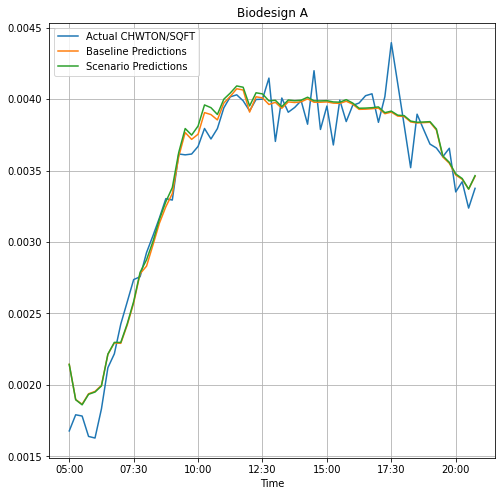

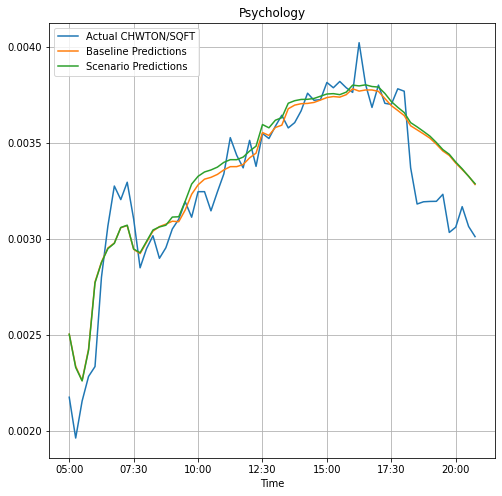

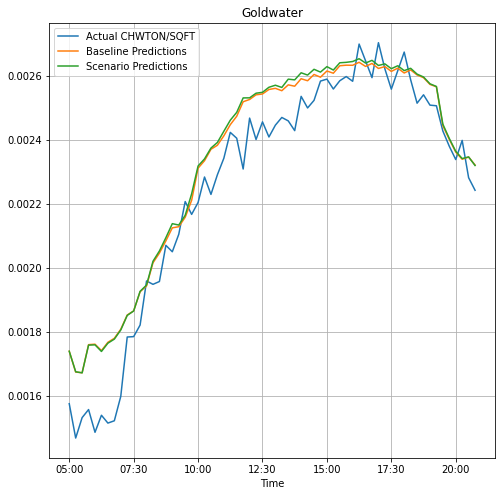

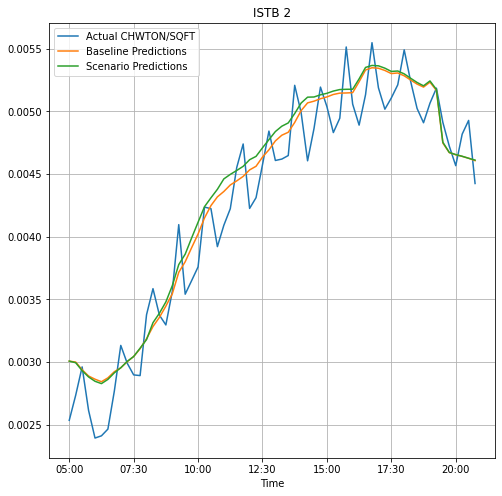

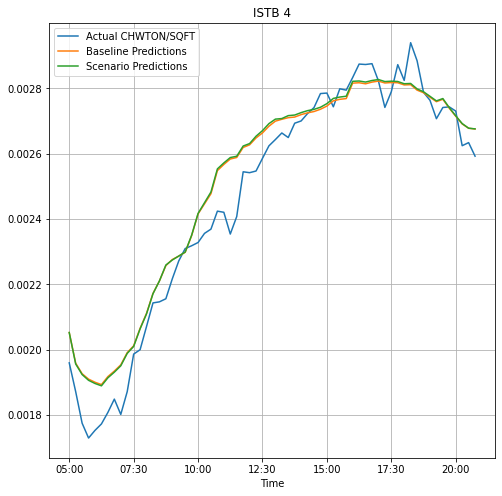

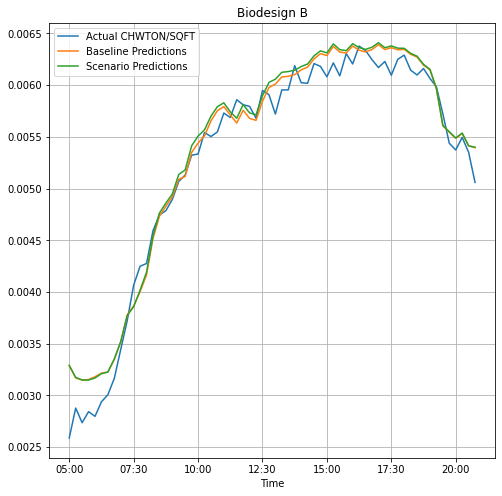

In [210]:
for i in range(len(final)):
  ax = final[i].plot(x='Time',y='Actual CHWTON/SQFT', figsize = (8,8))
  final[i].plot(x='Time',y='Baseline Predictions',figsize = (8,8),ax=ax)
  final[i].plot(x='Time',y='Scenario Predictions',figsize = (8,8),ax=ax)
  ax.set_title(final[i]['bldgname'][0])
  ax.grid(True)